In [1]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import sklearn.preprocessing
from sklearn.metrics import r2_score
from pandas import read_csv
from datetime import datetime
from keras.layers import Dense,Dropout,SimpleRNN,LSTM
from keras.models import Sequential

Using TensorFlow backend.


In [2]:
# load data
dataset = read_csv('C:/Users/Popeoba/Desktop/NCI/DMML2/Energy.csv')
dataset.head()

C:\Users\Popeoba\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,County,Sibiu,Harghita,Timisoara,Bucuresti,Bucuresti.1,Bucuresti.2,Bucuresti.3,Bucuresti.4,Cluj,...,Vaslui.6,Vaslui.7,Vaslui.8,Vaslui.9,Constanta,Arges,Arges.1,Arges.2,Arges.3,Arges.4
0,Client,Client 001,Client 002,Client 002,Client 002,Client 003,Client 004,Client 005,Client 006,Client 007,...,Client 008,Client 008,Client 008,Client 008,Client 009,Client 010,Client 010,Client 010,Client 010,Client 010
1,Activity,Activity 001,Activity 002,Activity 002,Activity 002,Activity 003,Activity 003,Activity 004,Activity 004,Activity 005,...,Activity 009,Activity 006,Activity 010,Activity 011,Activity 012,Activity 006,Activity 013,Activity 014,Activity 015,Activity 016
2,Ziua,CS mas,CS mas,CS mas,CS mas,CS mas,CS mas,CS mas,CS mas,CS mas,...,CS mas,CS mas,CS mas,CS mas,CS mas,CS mas,CS mas,CS mas,CS mas,CS mas
3,01/01/2017 01:00,1.6650,0.0400,0.2980,0.0700,0.0150,0.2050,0.3520,0.1240,0.0020,...,0.1750,0.0410,0.0290,0.0090,0.1710,0.0090,0.0080,0.0310,0.0200,0.0880
4,01/01/2017 02:00,1.6620,0.0410,0.2950,0.0700,0.0150,0.2080,0.3510,0.1240,0.0020,...,0.2020,0.0420,0.0290,0.0090,0.1700,0.0100,0.0090,0.0320,0.0220,0.0940


In [3]:
dataset.drop(dataset.index[[0,1,2]], inplace=True)
# manually specify column names
dataset.columns = ['datetime','SIB1001', 'HAR2002', 'TIM2002', 'BUC2002', 'BUC3003', 'BUC4003', 'BUC5004', 'BUC6004', 'CLU7005A', 'CLU7005B', 'CLU7005C', 'GAL8006A', 'GAL8007', 'GAL8006B', 'GAL8008','VAS8006A', 'VAS8006B', 'VAS8006C', 'LAS8006', 'VAS8006D', 'VAS8006E', 'VAS8006F', 'VAS8009', 'VAS8006G', 'VAS8010', 'VAS8011', 'CON9012', 'ARG1006', 'ARG1013', 'ARG1014', 'ARG1015', 'ARG1016']
# summarize first 5 rows
dataset.head()

,datetime,SIB1001,HAR2002,TIM2002,BUC2002,BUC3003,BUC4003,BUC5004,BUC6004,CLU7005A,...,VAS8009,VAS8006G,VAS8010,VAS8011,CON9012,ARG1006,ARG1013,ARG1014,ARG1015,ARG1016
3,01/01/2017 01:00,1.6650,0.0400,0.2980,0.0700,0.0150,0.2050,0.3520,0.1240,0.0020,...,0.1750,0.0410,0.0290,0.0090,0.1710,0.0090,0.0080,0.0310,0.0200,0.0880
4,01/01/2017 02:00,1.6620,0.0410,0.2950,0.0700,0.0150,0.2080,0.3510,0.1240,0.0020,...,0.2020,0.0420,0.0290,0.0090,0.1700,0.0100,0.0090,0.0320,0.0220,0.0940
5,01/01/2017 03:00,1.6250,0.0390,0.2990,0.0300,0.0150,0.2090,0.3550,0.1210,0.0020,...,0.2210,0.0450,0.0280,0.0090,0.1690,0.0090,0.0080,0.0320,0.0230,0.0900
6,01/01/2017 04:00,1.6770,0.0440,0.3010,0.0540,0.0150,0.2090,0.3540,0.1240,0.0020,...,0.1930,0.0430,0.0300,0.0090,0.1460,0.0090,0.0090,0.0320,0.0240,0.0930
7,01/01/2017 05:00,1.6610,0.0450,0.3290,0.0890,0.0150,0.2090,0.3500,0.1210,0.0020,...,0.1570,0.0430,0.0290,0.0100,0.1720,0.0090,0.0080,0.0310,0.0290,0.0930


In [4]:
# iterating the columns to get column names
for col in dataset.columns: 
    print(col)

datetime
SIB1001
HAR2002
TIM2002
BUC2002
BUC3003
BUC4003
BUC5004
BUC6004
CLU7005A
CLU7005B
CLU7005C
GAL8006A
GAL8007
GAL8006B
GAL8008
VAS8006A
VAS8006B
VAS8006C
LAS8006
VAS8006D
VAS8006E
VAS8006F
VAS8009
VAS8006G
VAS8010
VAS8011
CON9012
ARG1006
ARG1013
ARG1014
ARG1015
ARG1016


In [30]:
#Creating subsets for univariate analysis
SIB1001DF = dataset[['datetime', 'SIB1001']]
HAR2002DF = dataset[['datetime', 'HAR2002']]
TIM2002DF = dataset[['datetime', 'TIM2002']]
BUC2002DF = dataset[['datetime', 'BUC2002']]
BUC3003DF = dataset[['datetime', 'BUC3003']]
BUC4003DF = dataset[['datetime', 'BUC4003']]
BUC5004DF = dataset[['datetime', 'BUC5004']]
BUC6004DF = dataset[['datetime', 'BUC6004']]
CLU7005ADF = dataset[['datetime', 'CLU7005A']]
CLU7005BDF = dataset[['datetime', 'CLU7005B']]
CLU7005CDF = dataset[['datetime', 'CLU7005C']]
GAL8006ADF = dataset[['datetime', 'GAL8006A']]
GAL8007DF = dataset[['datetime', 'GAL8007']]
GAL8006BDF = dataset[['datetime', 'GAL8006B']]
GAL8008DF = dataset[['datetime', 'GAL8008']]
VAS8006ADF = dataset[['datetime', 'VAS8006A']]
VAS8006EDF = dataset[['datetime', 'VAS8006E']]
VAS8006FDF = dataset[['datetime', 'VAS8006F']]
VAS8009DF = dataset[['datetime', 'VAS8009']]
VAS8006GDF = dataset[['datetime', 'VAS8006G']]
VAS8010DF = dataset[['datetime', 'VAS8010']]
VAS8011DF = dataset[['datetime', 'VAS8011']]
CON9012DF = dataset[['datetime', 'CON9012']]
ARG1006DF = dataset[['datetime', 'ARG1006']]
ARG1013DF = dataset[['datetime', 'ARG1013']]
ARG1014DF = dataset[['datetime', 'ARG1014']]
ARG1015DF = dataset[['datetime', 'ARG1015']]
ARG1016DF = dataset[['datetime', 'ARG1016']]
VAS8006BDF = dataset[['datetime', 'VAS8006B']]
VAS8006CDF = dataset[['datetime', 'VAS8006C']]
LAS8006DF = dataset[['datetime', 'LAS8006']]
VAS8006DDF = dataset[['datetime', 'VAS8006D']]

In [6]:
# Univariate Analysis for SIB1001

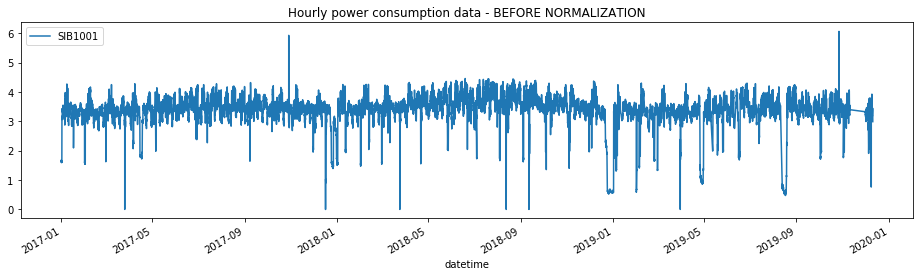

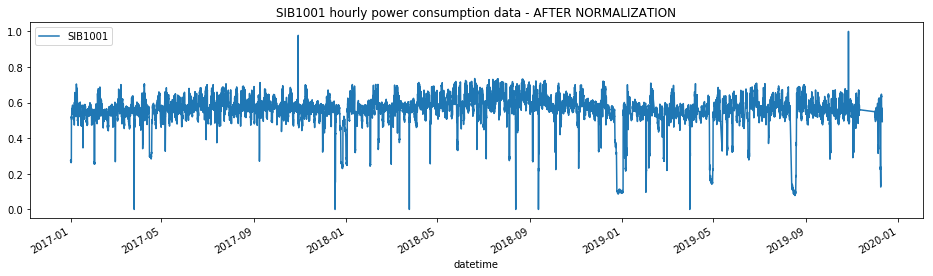

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Instructions for updating:
Colocations handled automatically by placer.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_1 (SimpleRNN)     (None, 20, 40)            1680      
_________________________________________________________________
dropout_1 (Dropout)          (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_2 (SimpleRNN)     (None, 20, 40)            3240      
_________________________________________________________________
dropout_2 (Dropout)          (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_3 (SimpleRNN)     (None, 40)                3240      
_________________________________________________________________
dr

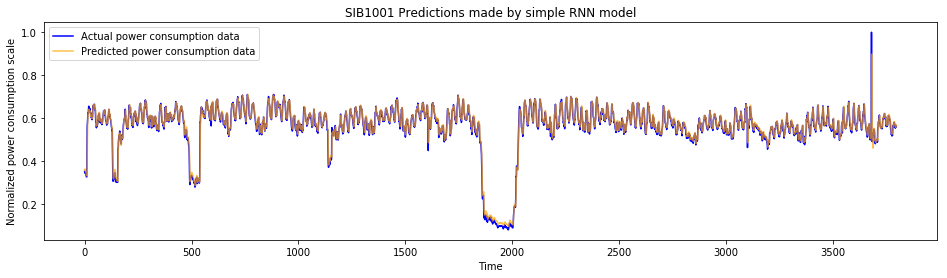

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 20, 40)            6720      
_________________________________________________________________
dropout_4 (Dropout)          (None, 20, 40)            0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 20, 40)            12960     
_________________________________________________________________
dropout_5 (Dropout)          (None, 20, 40)            0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 40)                12960     
_________________________________________________________________
dropout_6 (Dropout)          (None, 40)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                

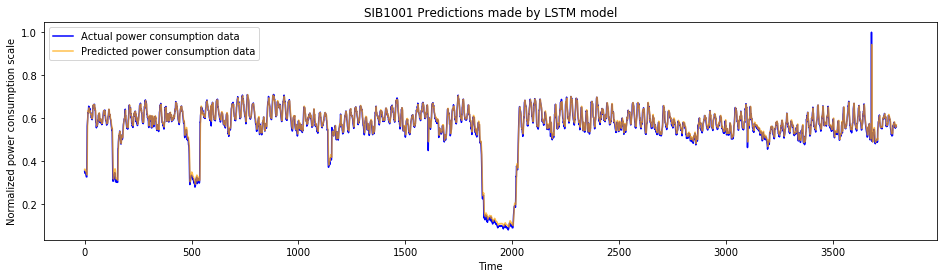

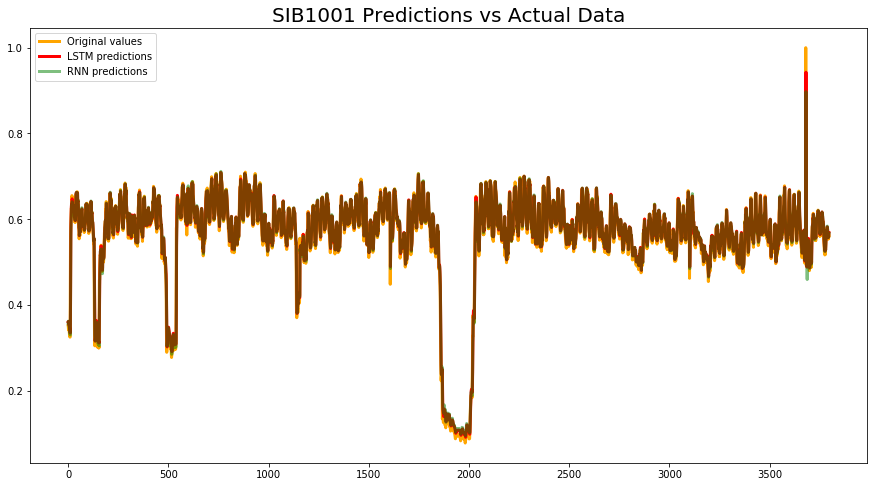

In [7]:
#dropping rows with missing data
SIB1001DF = SIB1001DF.dropna()
#checking missing data
SIB1001DF.isna().sum()

#column data type formatting
SIB1001DF.datetime = pd.to_datetime(SIB1001DF.datetime)
SIB1001DF.SIB1001 = pd.to_numeric(SIB1001DF.SIB1001)
SIB1001DF.set_index(['datetime'], inplace = True)
SIB1001DF.head()

#visualize data before normalization
SIB1001DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(SIB1001DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    SIB1001DF['SIB1001']=scaler.fit_transform(SIB1001DF['SIB1001'].values.reshape(-1,1))
    return SIB1001DF
SIB1001DF_norm = normalize_data(SIB1001DF)
SIB1001DF_norm.shape

#visualize data after normalization
SIB1001DF_norm.plot(figsize=(16,4),legend=True)
plt.title('SIB1001 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

SIB1001DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(SIB1001DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)
X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "SIB1001 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "SIB1001 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("SIB1001 Predictions vs Actual Data", fontsize=20)
plt.show()

In [8]:
# Univariate Analysis for HAR2002

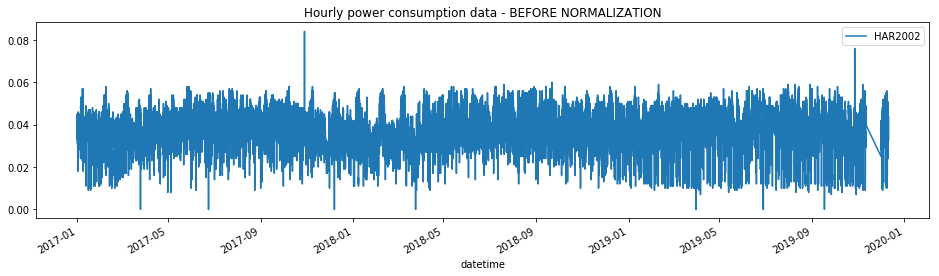

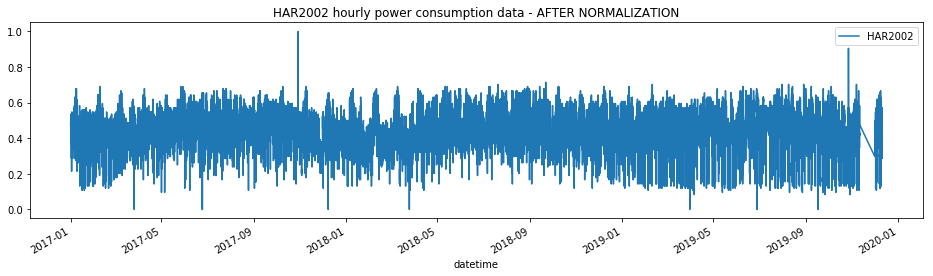

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_4 (SimpleRNN)     (None, 20, 40)            1680      
_________________________________________________________________
dropout_7 (Dropout)          (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_5 (SimpleRNN)     (None, 20, 40)            3240      
_________________________________________________________________
dropout_8 (Dropout)          (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_6 (SimpleRNN)     (None, 40)                3240      
_________________________________________________________________
dropout_9 (Dropout)          (None, 40)                0         
________

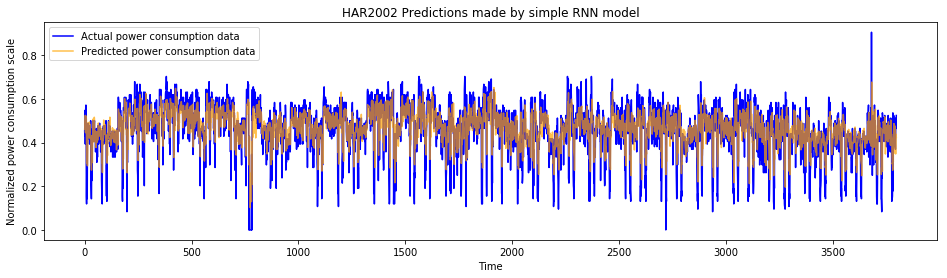

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 20, 40)            6720      
_________________________________________________________________
dropout_10 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_5 (LSTM)                (None, 20, 40)            12960     
_________________________________________________________________
dropout_11 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_6 (LSTM)                (None, 40)                12960     
_________________________________________________________________
dropout_12 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                

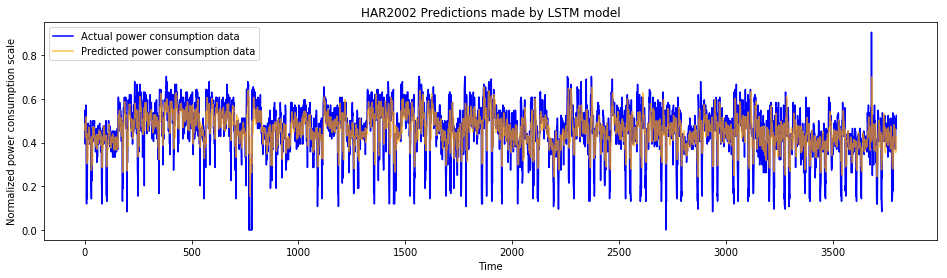

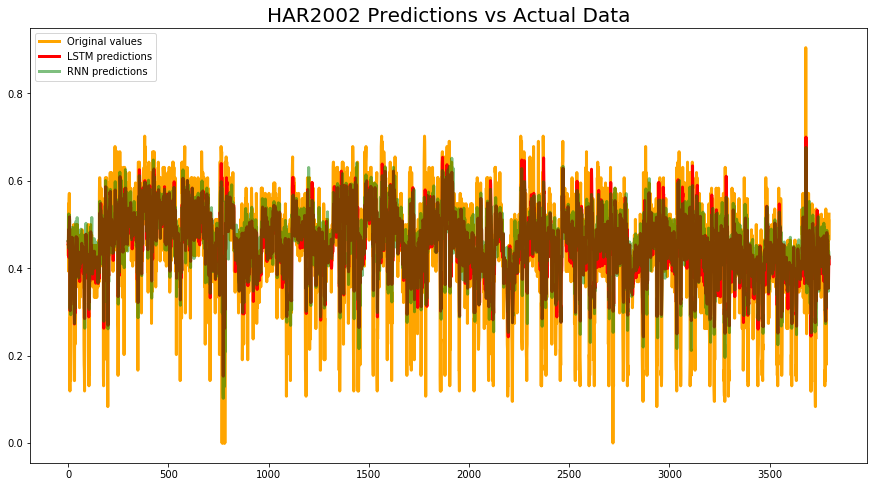

In [9]:
#dropping rows with missing data
HAR2002DF = HAR2002DF.dropna()
#checking missing data
HAR2002DF.isna().sum()

#column data type formatting
HAR2002DF.datetime = pd.to_datetime(HAR2002DF.datetime)
HAR2002DF.HAR2002 = pd.to_numeric(HAR2002DF.HAR2002)
HAR2002DF.set_index(['datetime'], inplace = True)
HAR2002DF.head()

#visualize data before normalization
HAR2002DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(HAR2002DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    HAR2002DF['HAR2002']=scaler.fit_transform(HAR2002DF['HAR2002'].values.reshape(-1,1))
    return HAR2002DF
HAR2002DF_norm = normalize_data(HAR2002DF)
HAR2002DF_norm.shape

#visualize data after normalization
HAR2002DF_norm.plot(figsize=(16,4),legend=True)
plt.title('HAR2002 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

HAR2002DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(HAR2002DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "HAR2002 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "HAR2002 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("HAR2002 Predictions vs Actual Data", fontsize=20)
plt.show()

In [10]:
# Univariate Analysis for TIM2002

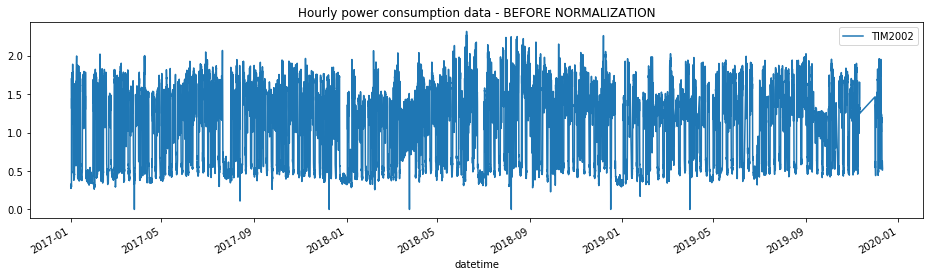

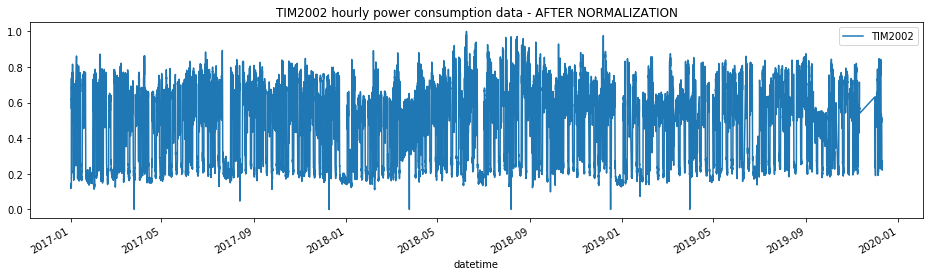

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_7 (SimpleRNN)     (None, 20, 40)            1680      
_________________________________________________________________
dropout_13 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_8 (SimpleRNN)     (None, 20, 40)            3240      
_________________________________________________________________
dropout_14 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_9 (SimpleRNN)     (None, 40)                3240      
_________________________________________________________________
dropout_15 (Dropout)         (None, 40)                0         
________

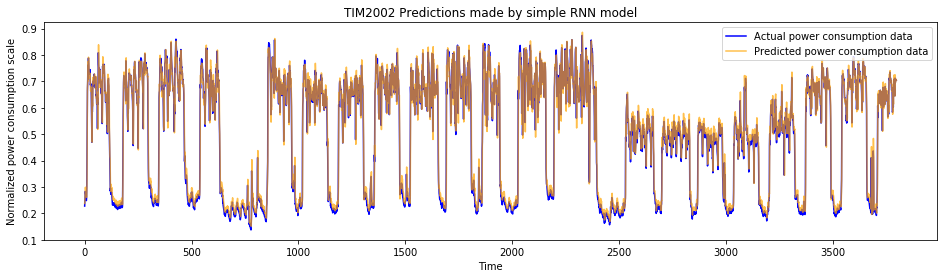

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (None, 20, 40)            6720      
_________________________________________________________________
dropout_16 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_8 (LSTM)                (None, 20, 40)            12960     
_________________________________________________________________
dropout_17 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_9 (LSTM)                (None, 40)                12960     
_________________________________________________________________
dropout_18 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                

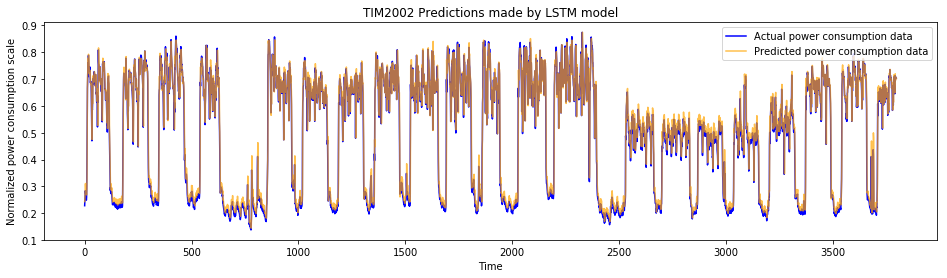

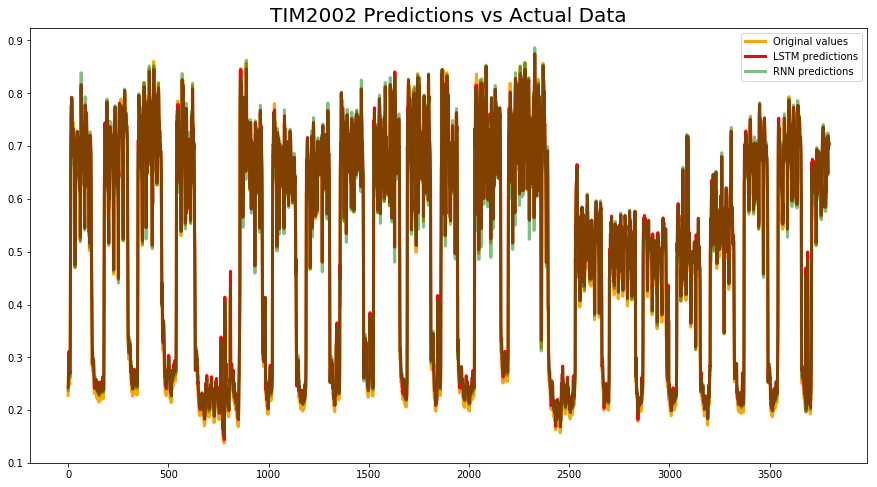

In [11]:
#dropping rows with missing data
TIM2002DF = TIM2002DF.dropna()
#checking missing data
TIM2002DF.isna().sum()

#column data type formatting
TIM2002DF.datetime = pd.to_datetime(TIM2002DF.datetime)
TIM2002DF.TIM2002 = pd.to_numeric(TIM2002DF.TIM2002)
TIM2002DF.set_index(['datetime'], inplace = True)
TIM2002DF.head()

#visualize data before normalization
TIM2002DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(TIM2002DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    TIM2002DF['TIM2002']=scaler.fit_transform(TIM2002DF['TIM2002'].values.reshape(-1,1))
    return TIM2002DF
TIM2002DF_norm = normalize_data(TIM2002DF)
TIM2002DF_norm.shape

#visualize data after normalization
TIM2002DF_norm.plot(figsize=(16,4),legend=True)
plt.title('TIM2002 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

TIM2002DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(TIM2002DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)
X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "TIM2002 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "TIM2002 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("TIM2002 Predictions vs Actual Data", fontsize=20)
plt.show()

In [12]:
# Univariate Analysis for BUC2002

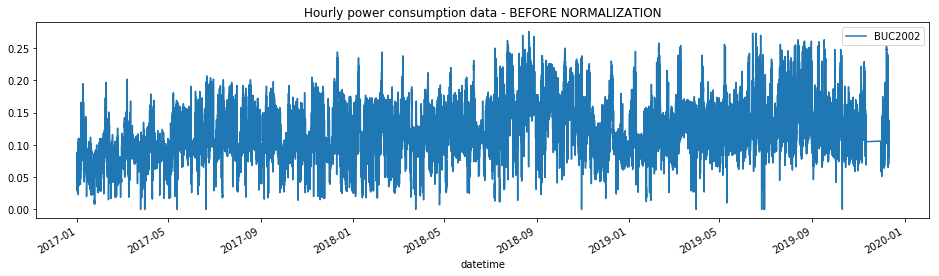

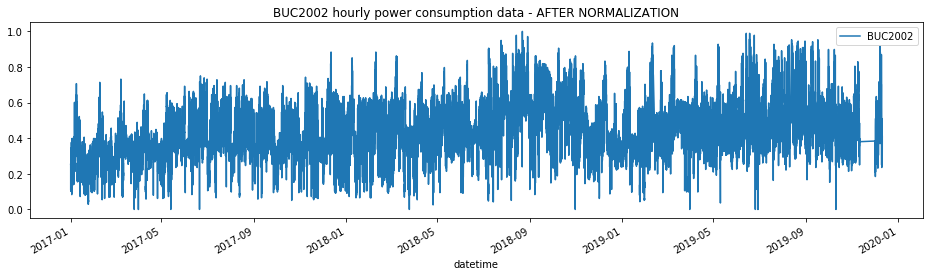

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_10 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_19 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_11 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_20 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_12 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_21 (Dropout)         (None, 40)                0         
________

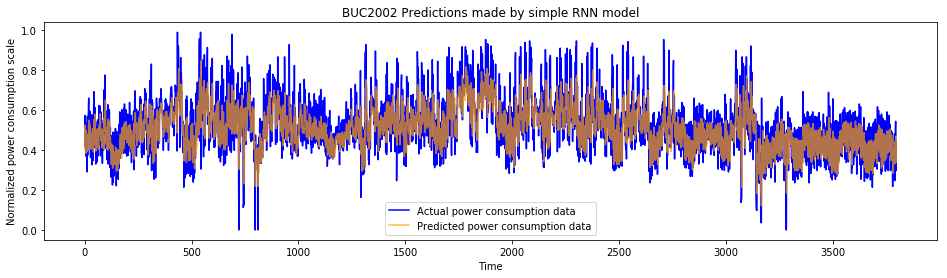

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_10 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_22 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_11 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_23 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_12 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_24 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 1)                

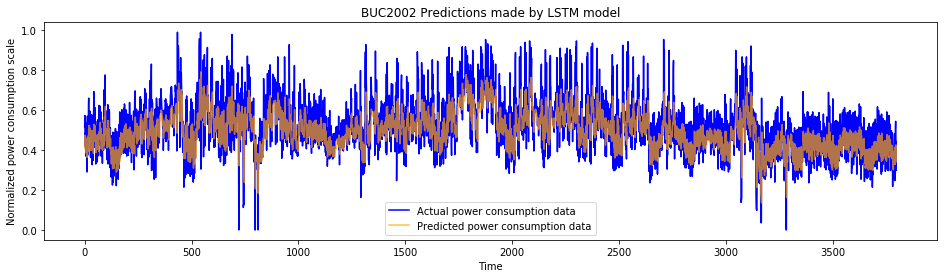

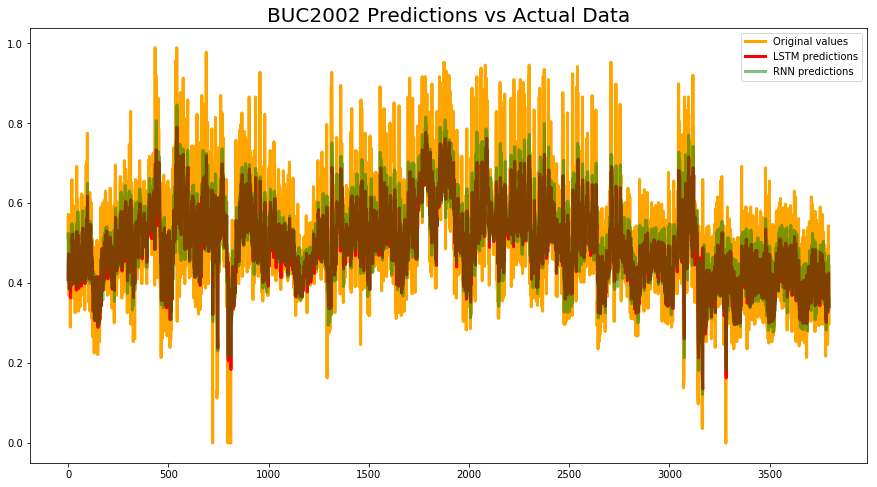

In [13]:
#dropping rows with missing data
BUC2002DF = BUC2002DF.dropna()
#checking missing data
BUC2002DF.isna().sum()

#column data type formatting
BUC2002DF.datetime = pd.to_datetime(BUC2002DF.datetime)
BUC2002DF.BUC2002 = pd.to_numeric(BUC2002DF.BUC2002)
BUC2002DF.set_index(['datetime'], inplace = True)
BUC2002DF.head()

#visualize data before normalization
BUC2002DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(BUC2002DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    BUC2002DF['BUC2002']=scaler.fit_transform(BUC2002DF['BUC2002'].values.reshape(-1,1))
    return BUC2002DF
BUC2002DF_norm = normalize_data(BUC2002DF)
BUC2002DF_norm.shape

#visualize data after normalization
BUC2002DF_norm.plot(figsize=(16,4),legend=True)
plt.title('BUC2002 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

BUC2002DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(BUC2002DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)
X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "BUC2002 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "BUC2002 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("BUC2002 Predictions vs Actual Data", fontsize=20)
plt.show()

In [14]:
# Univariate Analysis for BUC3003

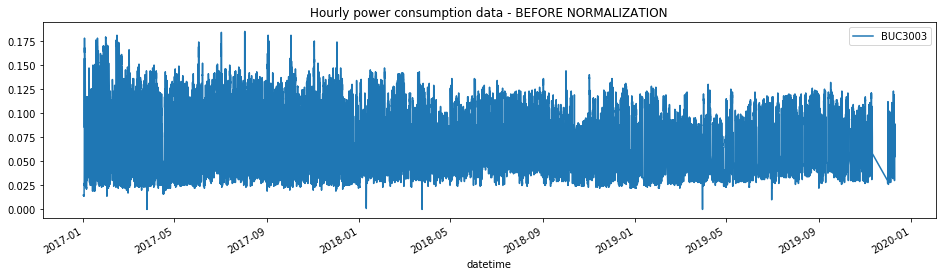

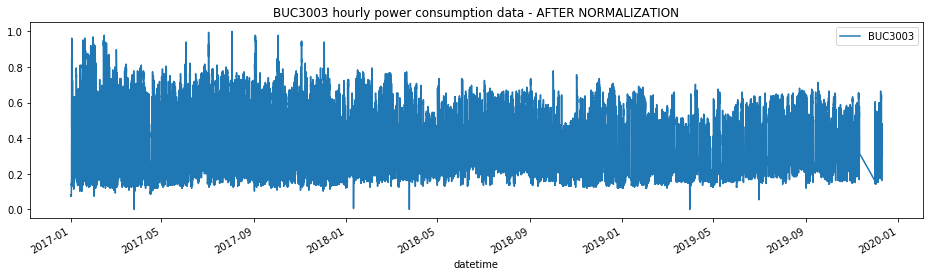

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_13 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_25 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_14 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_26 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_15 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_27 (Dropout)         (None, 40)                0         
________

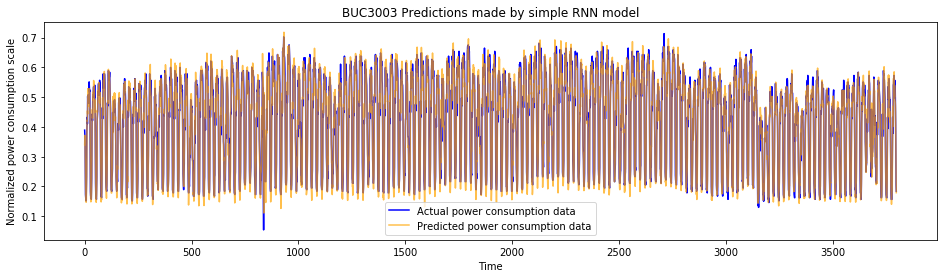

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_13 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_28 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_14 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_29 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_15 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_30 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 1)               

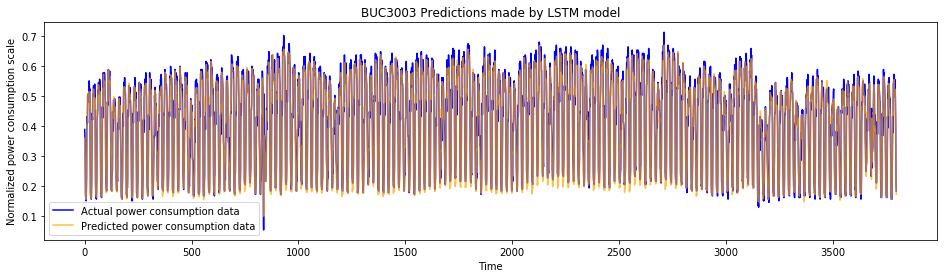

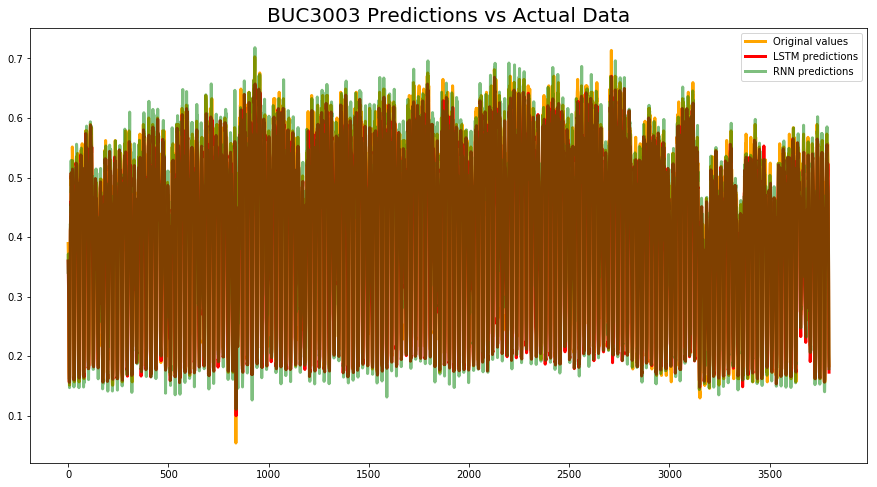

In [15]:
#dropping rows with missing data
BUC3003DF = BUC3003DF.dropna()
#checking missing data
BUC3003DF.isna().sum()

#column data type formatting
BUC3003DF.datetime = pd.to_datetime(BUC3003DF.datetime)
BUC3003DF.BUC3003 = pd.to_numeric(BUC3003DF.BUC3003)
BUC3003DF.set_index(['datetime'], inplace = True)
BUC3003DF.head()

#visualize data before normalization
BUC3003DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(BUC3003DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    BUC3003DF['BUC3003']=scaler.fit_transform(BUC3003DF['BUC3003'].values.reshape(-1,1))
    return BUC3003DF
BUC3003DF_norm = normalize_data(BUC3003DF)
BUC3003DF_norm.shape

#visualize data after normalization
BUC3003DF_norm.plot(figsize=(16,4),legend=True)
plt.title('BUC3003 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

BUC3003DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(BUC3003DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)
X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "BUC3003 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "BUC3003 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("BUC3003 Predictions vs Actual Data", fontsize=20)
plt.show()

In [16]:
# Univariate Analysis for BUC4003

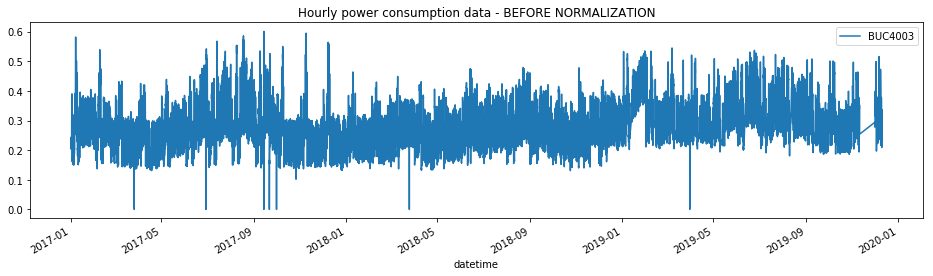

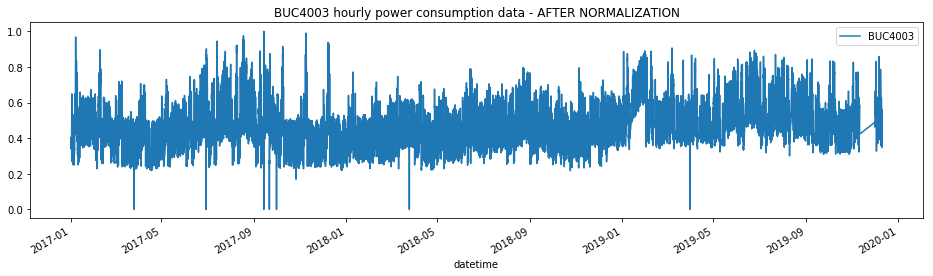

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_16 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_31 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_17 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_32 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_18 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_33 (Dropout)         (None, 40)                0         
_______

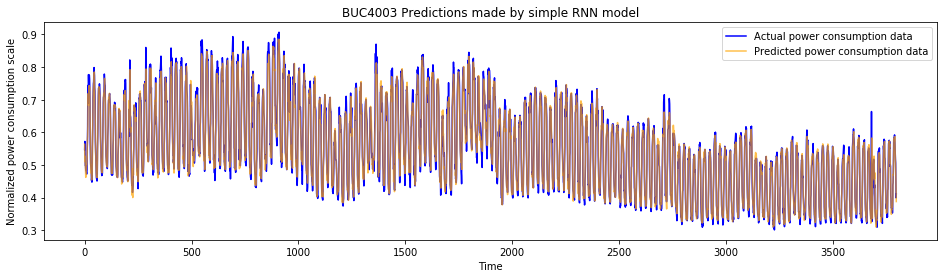

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_16 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_34 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_17 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_35 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_18 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_36 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_12 (Dense)             (None, 1)               

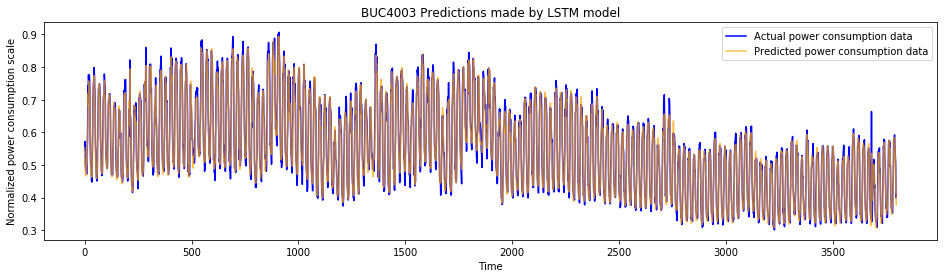

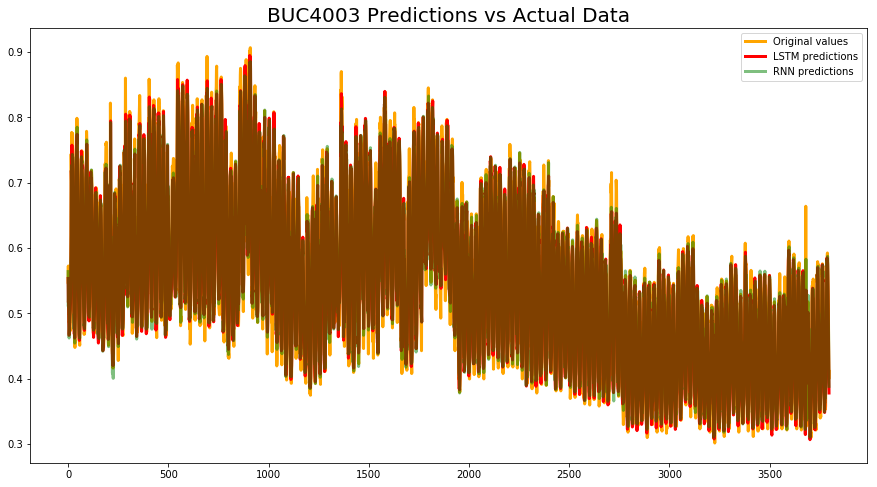

In [17]:
#dropping rows with missing data
BUC4003DF = BUC4003DF.dropna()
#checking missing data
BUC4003DF.isna().sum()

#column data type formatting
BUC4003DF.datetime = pd.to_datetime(BUC4003DF.datetime)
BUC4003DF.BUC4003 = pd.to_numeric(BUC4003DF.BUC4003)
BUC4003DF.set_index(['datetime'], inplace = True)
BUC4003DF.head()

#visualize data before normalization
BUC4003DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(BUC4003DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    BUC4003DF['BUC4003']=scaler.fit_transform(BUC4003DF['BUC4003'].values.reshape(-1,1))
    return BUC4003DF
BUC4003DF_norm = normalize_data(BUC4003DF)
BUC4003DF_norm.shape

#visualize data after normalization
BUC4003DF_norm.plot(figsize=(16,4),legend=True)
plt.title('BUC4003 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

BUC4003DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(BUC4003DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)
X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "BUC4003 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "BUC4003 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("BUC4003 Predictions vs Actual Data", fontsize=20)
plt.show()

In [18]:
# Univariate Analysis for BUC5004

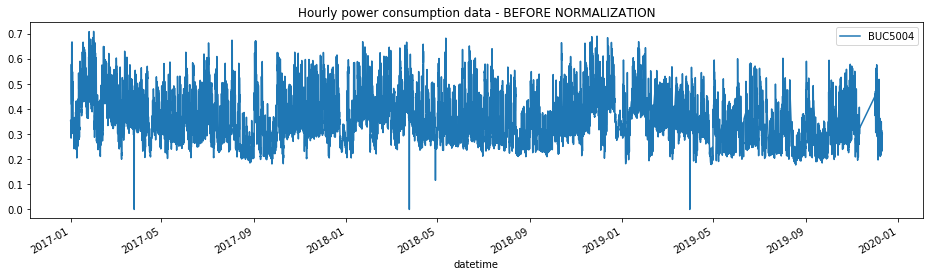

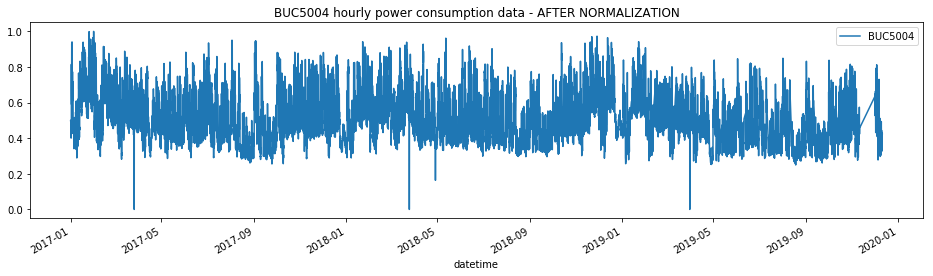

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_19 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_37 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_20 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_38 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_21 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_39 (Dropout)         (None, 40)                0         
_______

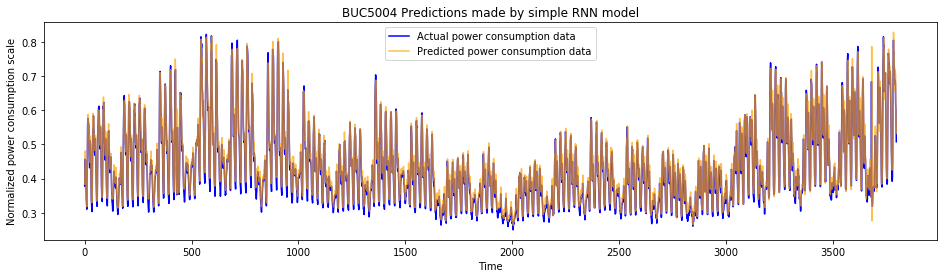

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_19 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_40 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_20 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_41 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_21 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_42 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 1)               

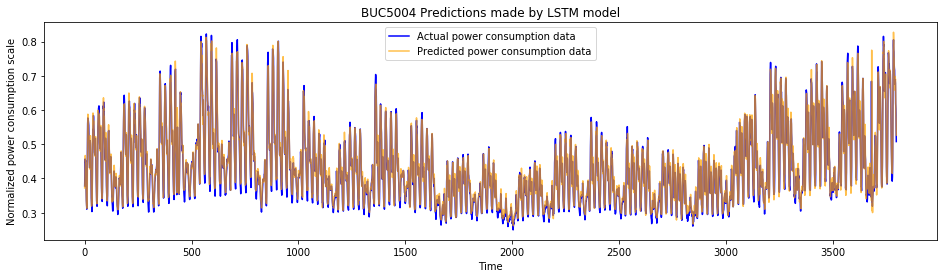

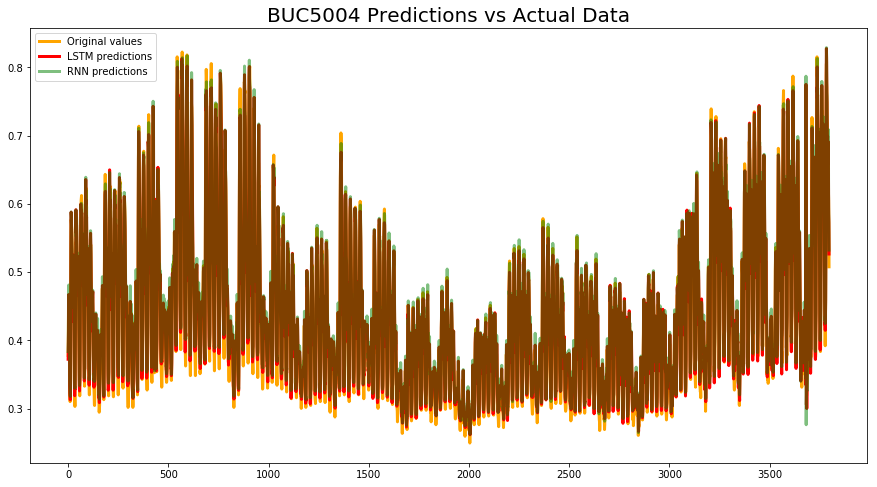

In [19]:
#dropping rows with missing data
BUC5004DF = BUC5004DF.dropna()
#checking missing data
BUC5004DF.isna().sum()

#column data type formatting
BUC5004DF.datetime = pd.to_datetime(BUC5004DF.datetime)
BUC5004DF.BUC5004 = pd.to_numeric(BUC5004DF.BUC5004)
BUC5004DF.set_index(['datetime'], inplace = True)
BUC5004DF.head()

#visualize data before normalization
BUC5004DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(BUC5004DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    BUC5004DF['BUC5004']=scaler.fit_transform(BUC5004DF['BUC5004'].values.reshape(-1,1))
    return BUC5004DF
BUC5004DF_norm = normalize_data(BUC5004DF)
BUC5004DF_norm.shape

#visualize data after normalization
BUC5004DF_norm.plot(figsize=(16,4),legend=True)
plt.title('BUC5004 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

BUC5004DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(BUC5004DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)
X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "BUC5004 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "BUC5004 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("BUC5004 Predictions vs Actual Data", fontsize=20)
plt.show()

In [20]:
# Univariate Analysis for BUC6004

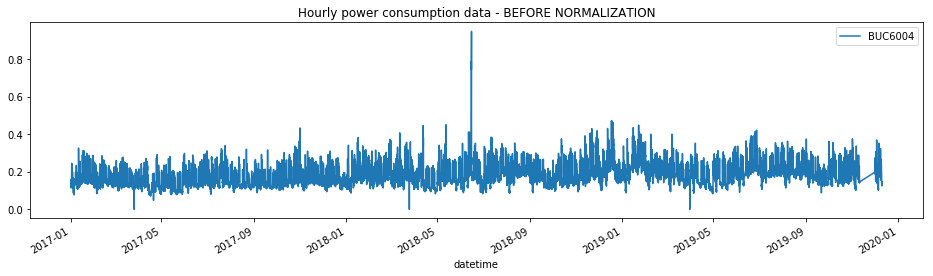

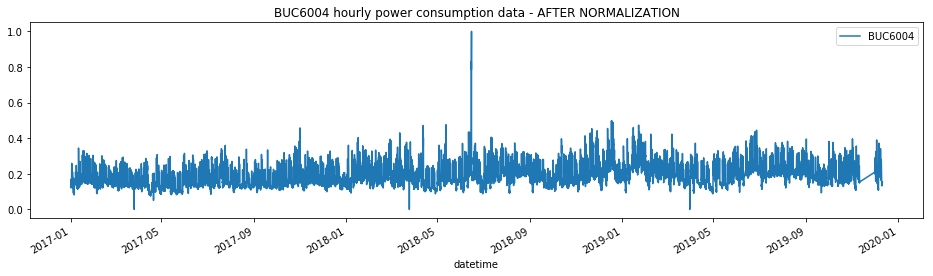

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_22 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_43 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_23 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_44 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_24 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_45 (Dropout)         (None, 40)                0         
_______

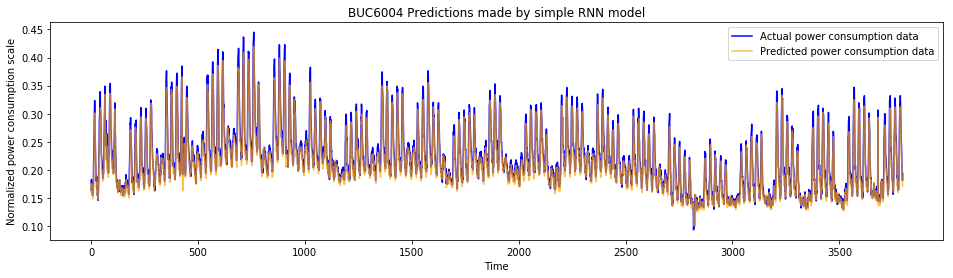

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_22 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_46 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_23 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_47 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_24 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_48 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_16 (Dense)             (None, 1)               

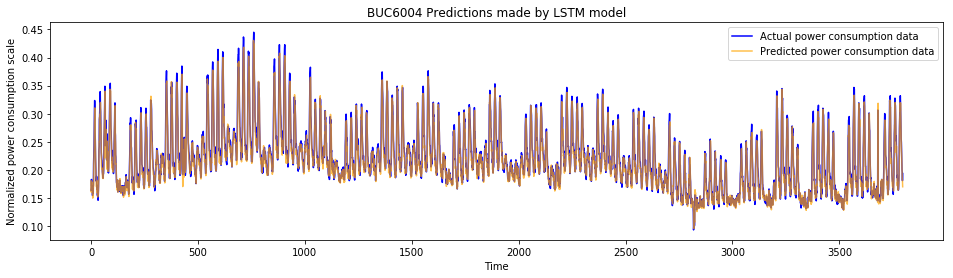

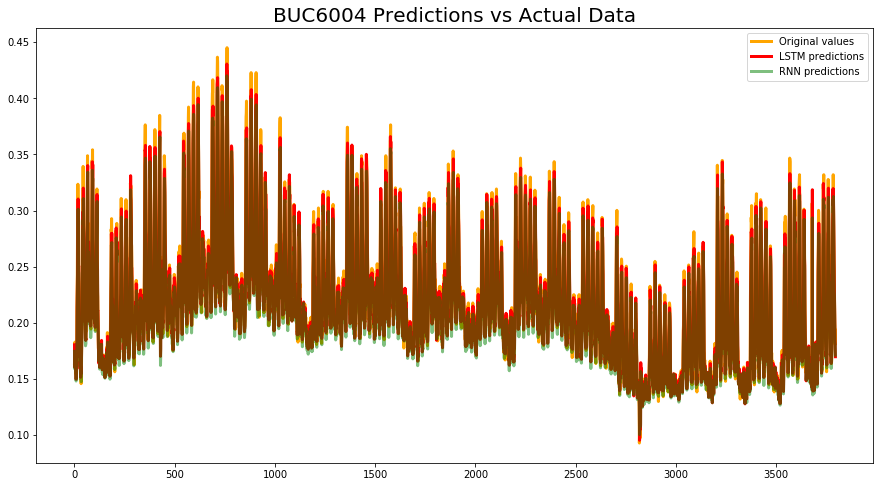

In [21]:
#dropping rows with missing data
BUC6004DF = BUC6004DF.dropna()
#checking missing data
BUC6004DF.isna().sum()

#column data type formatting
BUC6004DF.datetime = pd.to_datetime(BUC6004DF.datetime)
BUC6004DF.BUC6004 = pd.to_numeric(BUC6004DF.BUC6004)
BUC6004DF.set_index(['datetime'], inplace = True)
BUC6004DF.head()

#visualize data before normalization
BUC6004DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(BUC6004DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    BUC6004DF['BUC6004']=scaler.fit_transform(BUC6004DF['BUC6004'].values.reshape(-1,1))
    return BUC6004DF
BUC6004DF_norm = normalize_data(BUC6004DF)
BUC6004DF_norm.shape

#visualize data after normalization
BUC6004DF_norm.plot(figsize=(16,4),legend=True)
plt.title('BUC6004 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

BUC6004DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(BUC6004DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)
X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "BUC6004 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "BUC6004 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("BUC6004 Predictions vs Actual Data", fontsize=20)
plt.show()

In [22]:
# Univariate Analysis for CLU7005A

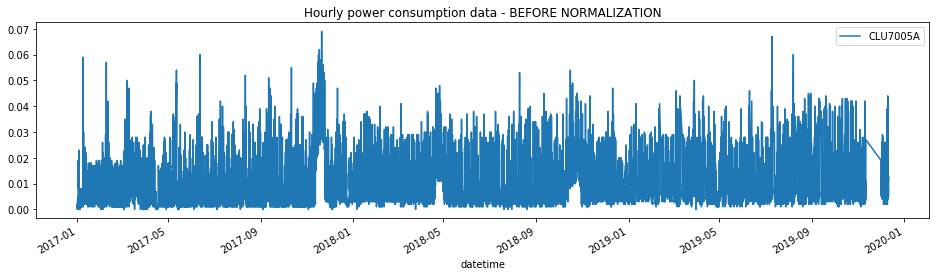

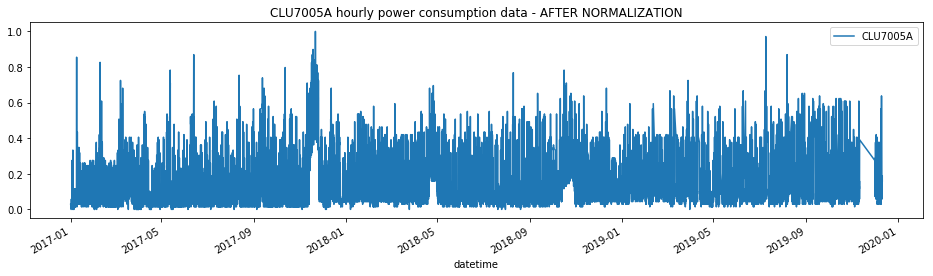

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_25 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_49 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_26 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_50 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_27 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_51 (Dropout)         (None, 40)                0         
_______

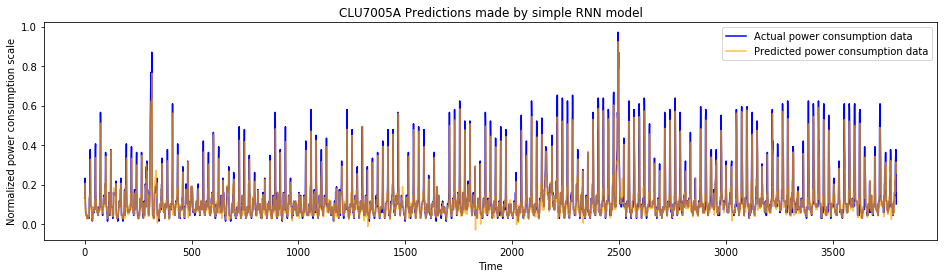

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_25 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_52 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_26 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_53 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_27 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_54 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_18 (Dense)             (None, 1)               

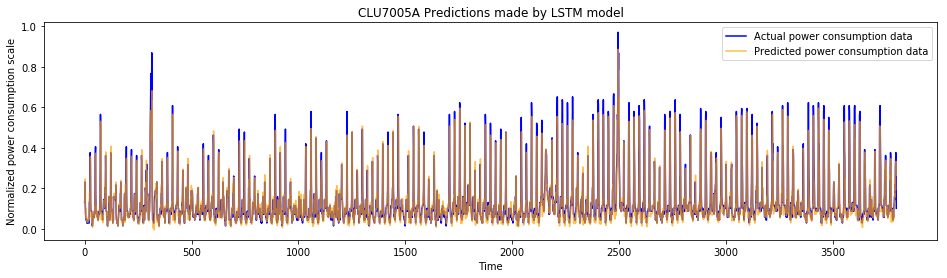

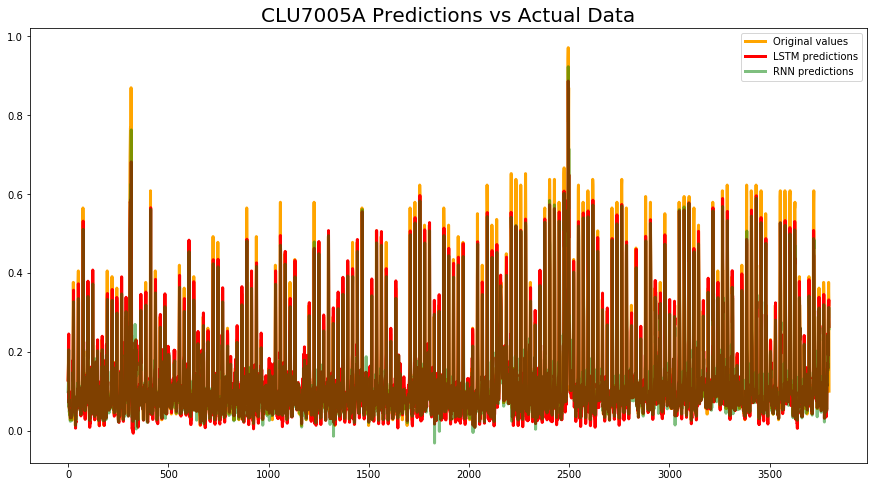

In [23]:
#dropping rows with missing data
CLU7005ADF = CLU7005ADF.dropna()
#checking missing data
CLU7005ADF.isna().sum()

#column data type formatting
CLU7005ADF.datetime = pd.to_datetime(CLU7005ADF.datetime)
CLU7005ADF.CLU7005A = pd.to_numeric(CLU7005ADF.CLU7005A)
CLU7005ADF.set_index(['datetime'], inplace = True)
CLU7005ADF.head()

#visualize data before normalization
CLU7005ADF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(CLU7005ADF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    CLU7005ADF['CLU7005A']=scaler.fit_transform(CLU7005ADF['CLU7005A'].values.reshape(-1,1))
    return CLU7005ADF
CLU7005ADF_norm = normalize_data(CLU7005ADF)
CLU7005ADF_norm.shape

#visualize data after normalization
CLU7005ADF_norm.plot(figsize=(16,4),legend=True)
plt.title('CLU7005A hourly power consumption data - AFTER NORMALIZATION')
plt.show()

CLU7005ADF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(CLU7005ADF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)
X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "CLU7005A Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "CLU7005A Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("CLU7005A Predictions vs Actual Data", fontsize=20)
plt.show()

In [24]:
# Univariate Analysis for CLU7005B

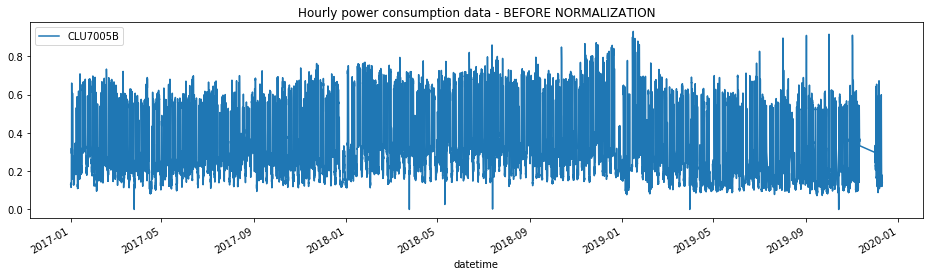

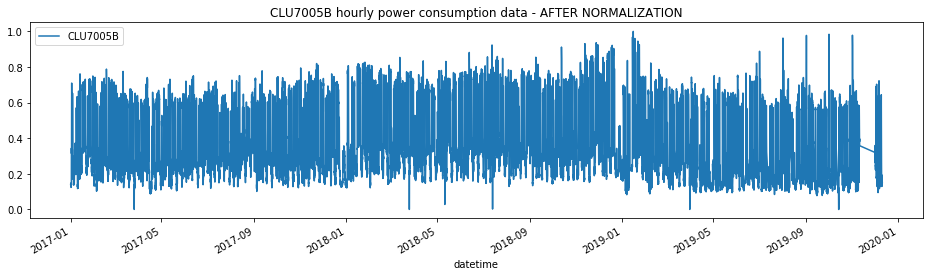

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_28 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_55 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_29 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_56 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_30 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_57 (Dropout)         (None, 40)                0         
_______

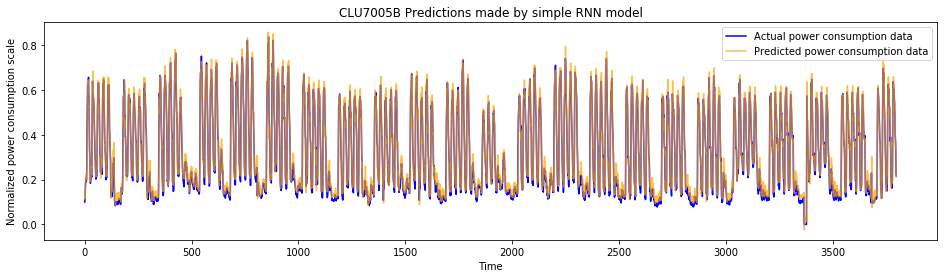

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_28 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_58 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_29 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_59 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_30 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_60 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_20 (Dense)             (None, 1)               

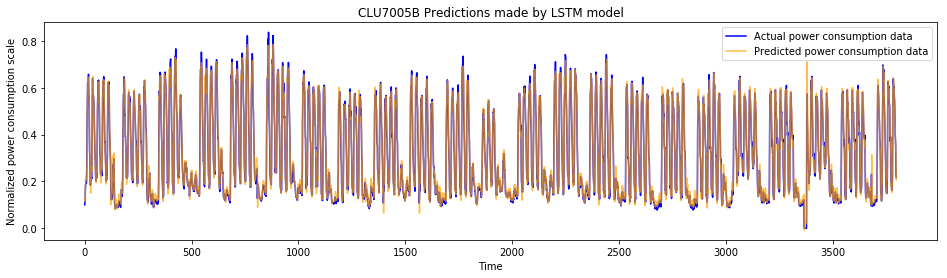

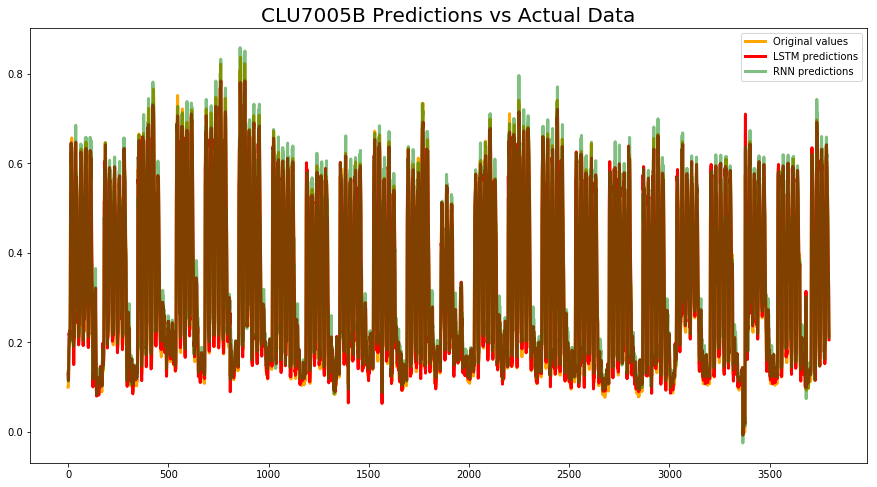

In [25]:
#dropping rows with missing data
CLU7005BDF = CLU7005BDF.dropna()
#checking missing data
CLU7005BDF.isna().sum()

#column data type formatting
CLU7005BDF.datetime = pd.to_datetime(CLU7005BDF.datetime)
CLU7005BDF.CLU7005B = pd.to_numeric(CLU7005BDF.CLU7005B)
CLU7005BDF.set_index(['datetime'], inplace = True)
CLU7005BDF.head()

#visualize data before normalization
CLU7005BDF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(CLU7005BDF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    CLU7005BDF['CLU7005B']=scaler.fit_transform(CLU7005BDF['CLU7005B'].values.reshape(-1,1))
    return CLU7005BDF
CLU7005BDF_norm = normalize_data(CLU7005BDF)
CLU7005BDF_norm.shape

#visualize data after normalization
CLU7005BDF_norm.plot(figsize=(16,4),legend=True)
plt.title('CLU7005B hourly power consumption data - AFTER NORMALIZATION')
plt.show()

CLU7005BDF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(CLU7005BDF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)
X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "CLU7005B Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "CLU7005B Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("CLU7005B Predictions vs Actual Data", fontsize=20)
plt.show()

In [26]:
# Univariate Analysis for CLU7005C

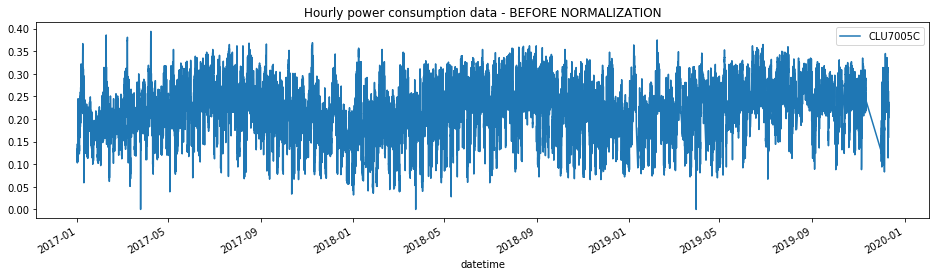

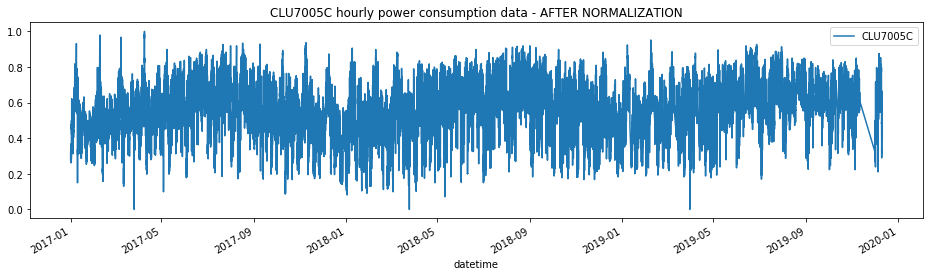

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_31 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_61 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_32 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_62 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_33 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_63 (Dropout)         (None, 40)                0         
_______

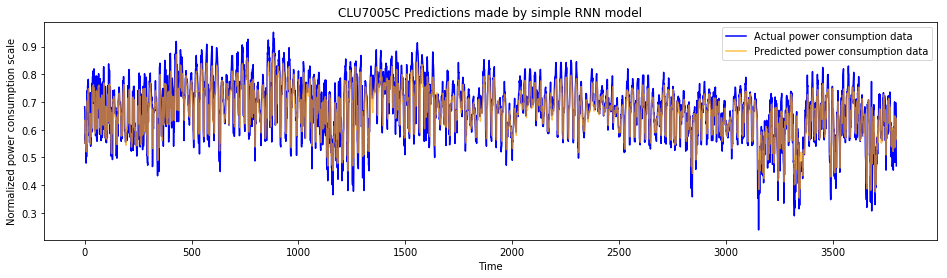

Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_31 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_64 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_32 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_65 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_33 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_66 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_22 (Dense)             (None, 1)               

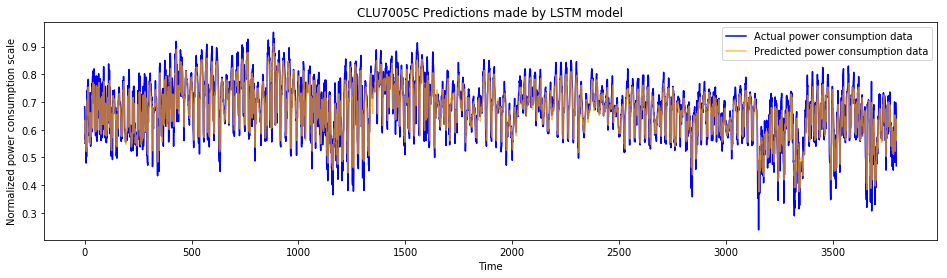

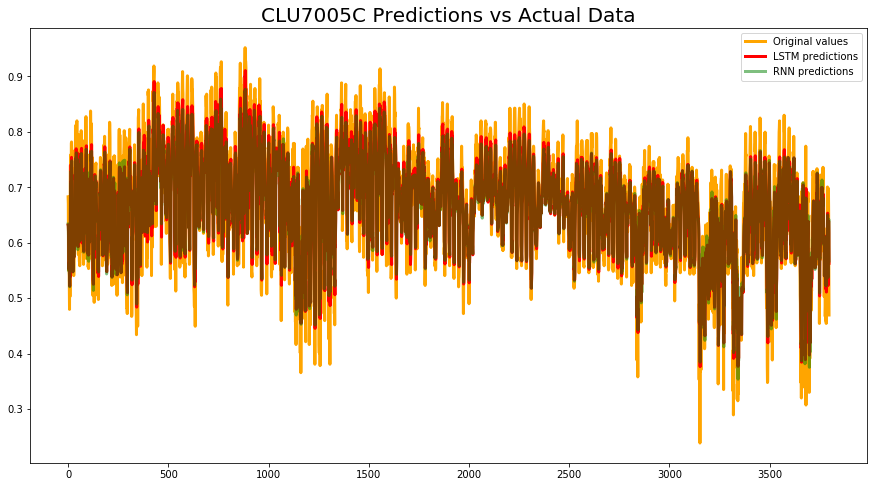

In [27]:
#dropping rows with missing data
CLU7005CDF = CLU7005CDF.dropna()
#checking missing data
CLU7005CDF.isna().sum()

#column data type formatting
CLU7005CDF.datetime = pd.to_datetime(CLU7005CDF.datetime)
CLU7005CDF.CLU7005C = pd.to_numeric(CLU7005CDF.CLU7005C)
CLU7005CDF.set_index(['datetime'], inplace = True)
CLU7005CDF.head()

#visualize data before normalization
CLU7005CDF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(CLU7005CDF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    CLU7005CDF['CLU7005C']=scaler.fit_transform(CLU7005CDF['CLU7005C'].values.reshape(-1,1))
    return CLU7005CDF
CLU7005CDF_norm = normalize_data(CLU7005CDF)
CLU7005CDF_norm.shape

#visualize data after normalization
CLU7005CDF_norm.plot(figsize=(16,4),legend=True)
plt.title('CLU7005C hourly power consumption data - AFTER NORMALIZATION')
plt.show()

CLU7005CDF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(CLU7005CDF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)
X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "CLU7005C Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "CLU7005C Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("CLU7005C Predictions vs Actual Data", fontsize=20)
plt.show()

In [28]:
# Univariate Analysis for GAL8006A

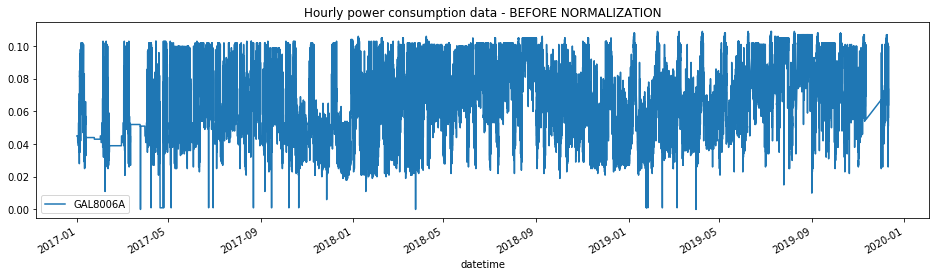

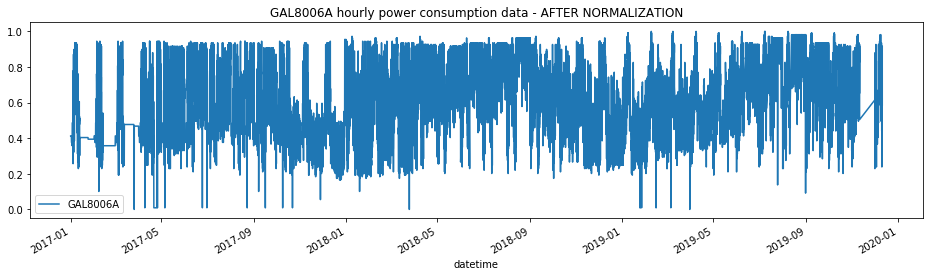

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3798, 20, 1)
y_test.shape =  (3798,)
Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_34 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_67 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_35 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_68 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_36 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_69 (Dropout)         (None, 40)                0         
_______

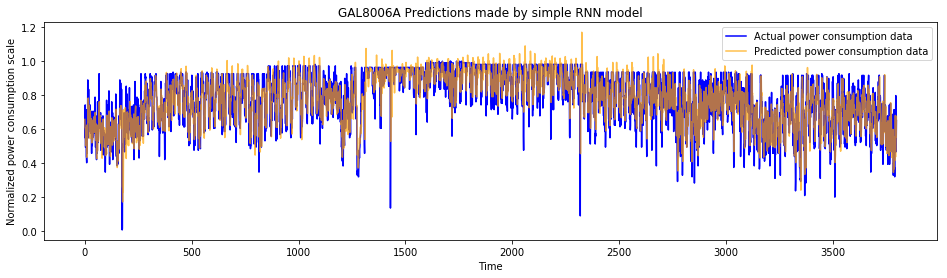

Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_34 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_70 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_35 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_71 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_36 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_72 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_24 (Dense)             (None, 1)               

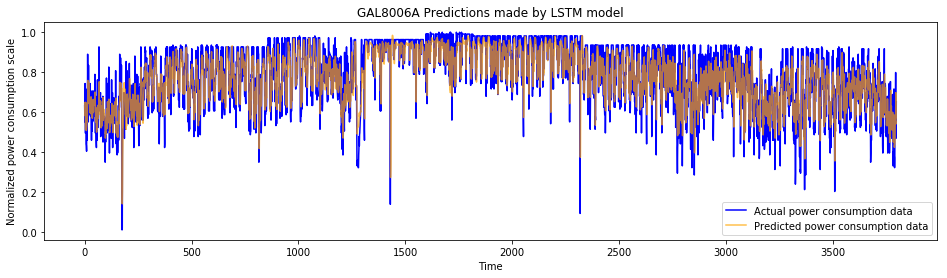

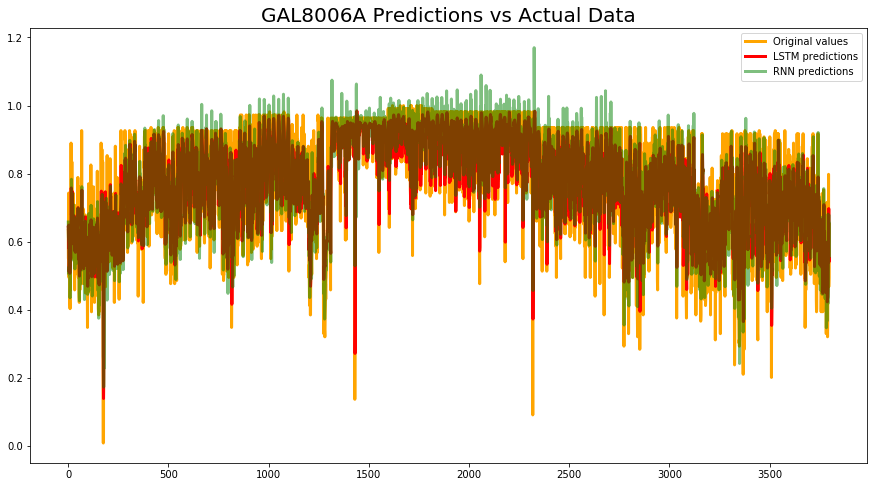

In [31]:
#dropping rows with missing data
GAL8006ADF = GAL8006ADF.dropna()
#checking missing data
GAL8006ADF.isna().sum()

#column data type formatting
GAL8006ADF.datetime = pd.to_datetime(GAL8006ADF.datetime)
GAL8006ADF.GAL8006A = pd.to_numeric(GAL8006ADF.GAL8006A)
GAL8006ADF.set_index(['datetime'], inplace = True)
GAL8006ADF.head()

#visualize data before normalization
GAL8006ADF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(GAL8006ADF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    GAL8006ADF['GAL8006A']=scaler.fit_transform(GAL8006ADF['GAL8006A'].values.reshape(-1,1))
    return GAL8006ADF
GAL8006ADF_norm = normalize_data(GAL8006ADF)
GAL8006ADF_norm.shape

#visualize data after normalization
GAL8006ADF_norm.plot(figsize=(16,4),legend=True)
plt.title('GAL8006A hourly power consumption data - AFTER NORMALIZATION')
plt.show()

GAL8006ADF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(GAL8006ADF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "GAL8006A Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "GAL8006A Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("GAL8006A Predictions vs Actual Data", fontsize=20)
plt.show()

In [32]:
# Univariate Analysis for GAL8007

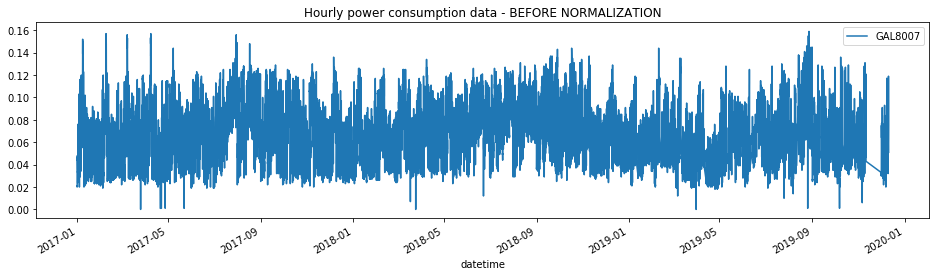

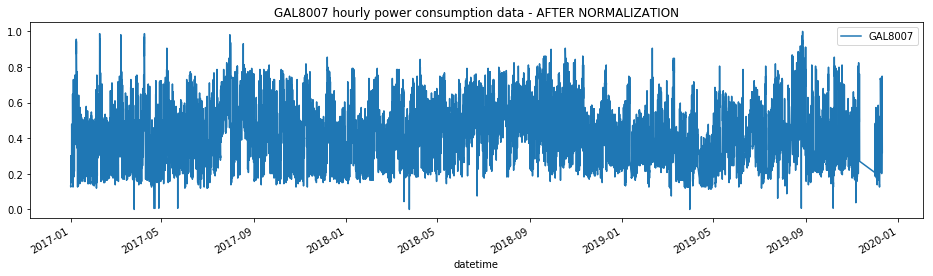

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3798, 20, 1)
y_test.shape =  (3798,)
Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_37 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_73 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_38 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_74 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_39 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_75 (Dropout)         (None, 40)                0         
_______

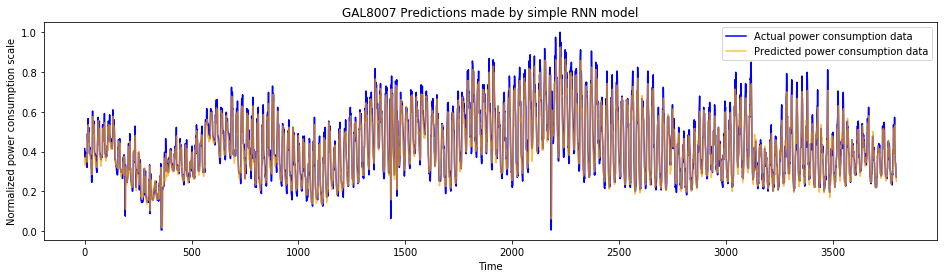

Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_37 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_76 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_38 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_77 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_39 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_78 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_26 (Dense)             (None, 1)               

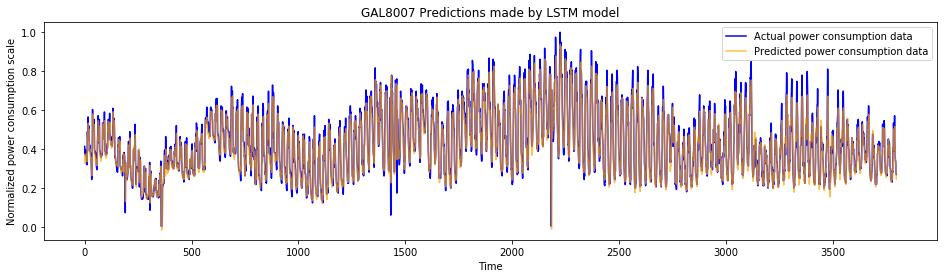

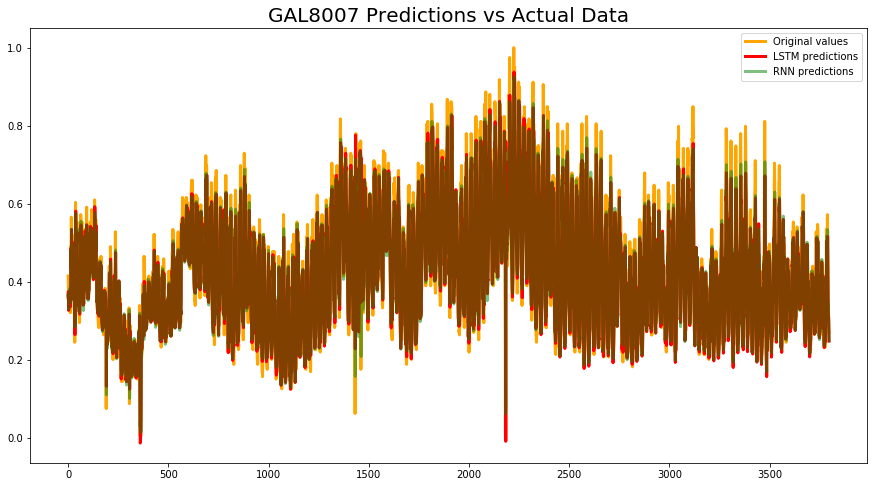

In [33]:
#dropping rows with missing data
GAL8007DF = GAL8007DF.dropna()
#checking missing data
GAL8007DF.isna().sum()

#column data type formatting
GAL8007DF.datetime = pd.to_datetime(GAL8007DF.datetime)
GAL8007DF.GAL8007 = pd.to_numeric(GAL8007DF.GAL8007)
GAL8007DF.set_index(['datetime'], inplace = True)
GAL8007DF.head()

#visualize data before normalization
GAL8007DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(GAL8007DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    GAL8007DF['GAL8007']=scaler.fit_transform(GAL8007DF['GAL8007'].values.reshape(-1,1))
    return GAL8007DF
GAL8007DF_norm = normalize_data(GAL8007DF)
GAL8007DF_norm.shape

#visualize data after normalization
GAL8007DF_norm.plot(figsize=(16,4),legend=True)
plt.title('GAL8007 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

GAL8007DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(GAL8007DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "GAL8007 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "GAL8007 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("GAL8007 Predictions vs Actual Data", fontsize=20)
plt.show()

In [34]:
# Univariate Analysis for GAL8006B

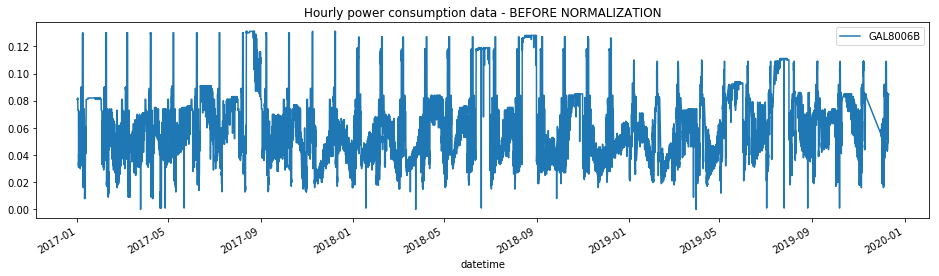

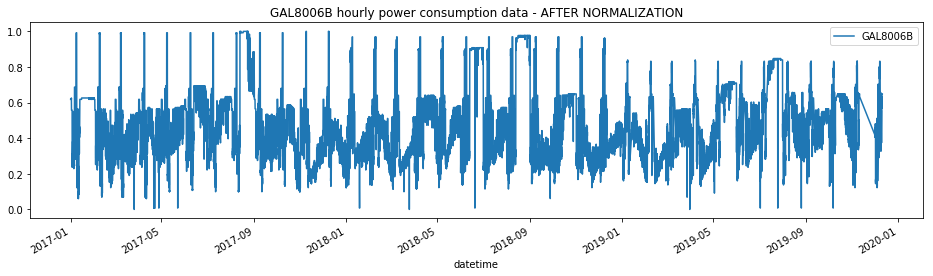

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3798, 20, 1)
y_test.shape =  (3798,)
Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_40 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_79 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_41 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_80 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_42 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_81 (Dropout)         (None, 40)                0         
_______

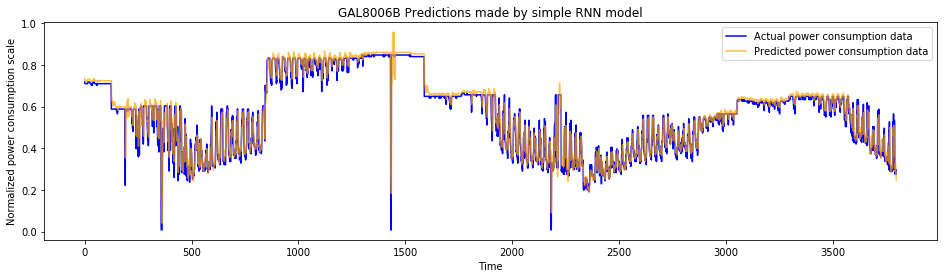

Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_40 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_82 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_41 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_83 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_42 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_84 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_28 (Dense)             (None, 1)               

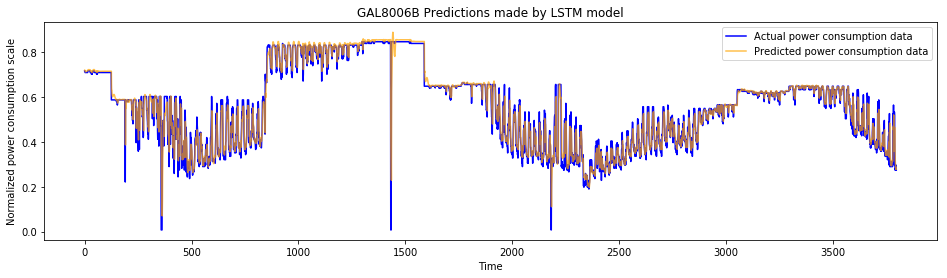

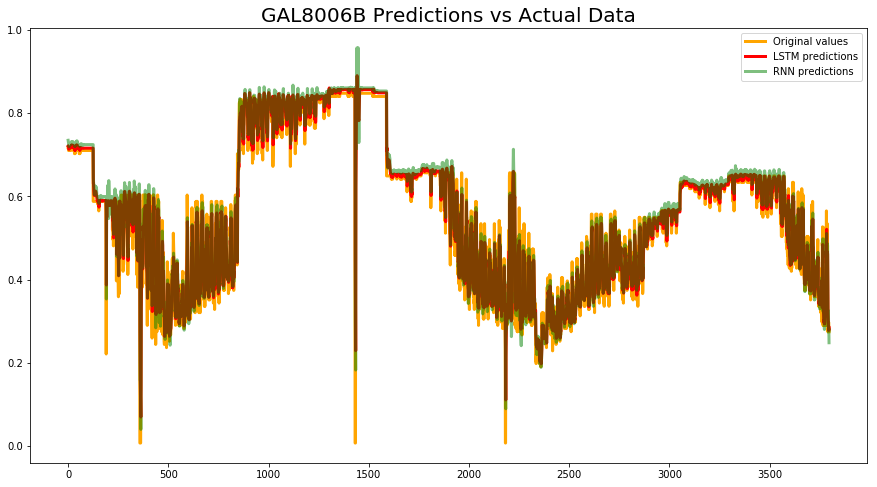

In [35]:
#dropping rows with missing data
GAL8006BDF = GAL8006BDF.dropna()
#checking missing data
GAL8006BDF.isna().sum()

#column data type formatting
GAL8006BDF.datetime = pd.to_datetime(GAL8006BDF.datetime)
GAL8006BDF.GAL8006B = pd.to_numeric(GAL8006BDF.GAL8006B)
GAL8006BDF.set_index(['datetime'], inplace = True)
GAL8006BDF.head()

#visualize data before normalization
GAL8006BDF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(GAL8006BDF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    GAL8006BDF['GAL8006B']=scaler.fit_transform(GAL8006BDF['GAL8006B'].values.reshape(-1,1))
    return GAL8006BDF
GAL8006BDF_norm = normalize_data(GAL8006BDF)
GAL8006BDF_norm.shape

#visualize data after normalization
GAL8006BDF_norm.plot(figsize=(16,4),legend=True)
plt.title('GAL8006B hourly power consumption data - AFTER NORMALIZATION')
plt.show()

GAL8006BDF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(GAL8006BDF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "GAL8006B Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "GAL8006B Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("GAL8006B Predictions vs Actual Data", fontsize=20)
plt.show()

In [36]:
# Univariate Analysis for GAL8008

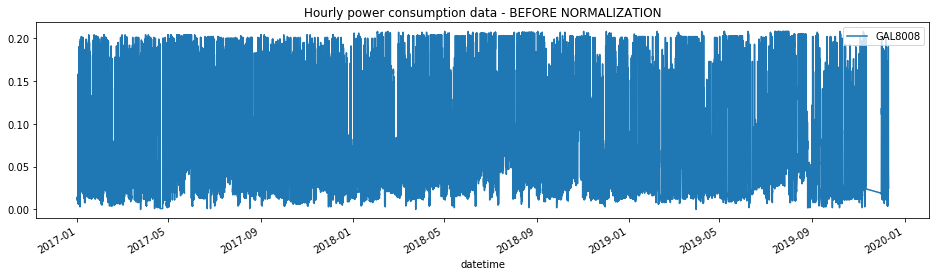

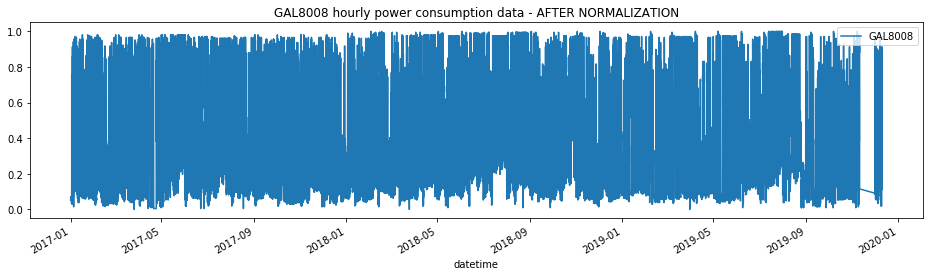

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3798, 20, 1)
y_test.shape =  (3798,)
Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_43 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_85 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_44 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_86 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_45 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_87 (Dropout)         (None, 40)                0         
_______

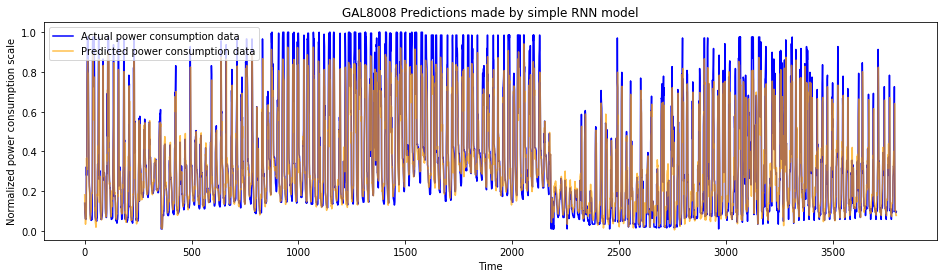

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_43 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_88 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_44 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_89 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_45 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_90 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_30 (Dense)             (None, 1)               

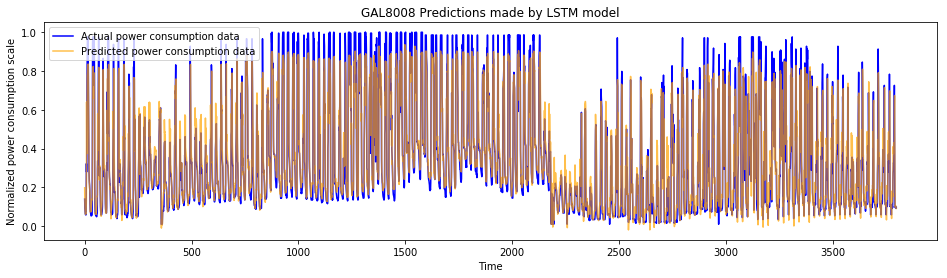

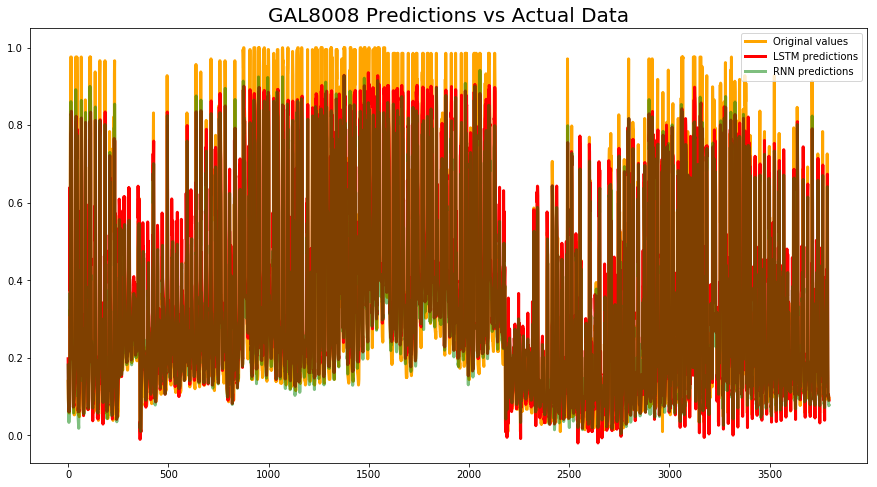

In [37]:
#dropping rows with missing data
GAL8008DF = GAL8008DF.dropna()
#checking missing data
GAL8008DF.isna().sum()

#column data type formatting
GAL8008DF.datetime = pd.to_datetime(GAL8008DF.datetime)
GAL8008DF.GAL8008 = pd.to_numeric(GAL8008DF.GAL8008)
GAL8008DF.set_index(['datetime'], inplace = True)
GAL8008DF.head()

#visualize data before normalization
GAL8008DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(GAL8008DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    GAL8008DF['GAL8008']=scaler.fit_transform(GAL8008DF['GAL8008'].values.reshape(-1,1))
    return GAL8008DF
GAL8008DF_norm = normalize_data(GAL8008DF)
GAL8008DF_norm.shape

#visualize data after normalization
GAL8008DF_norm.plot(figsize=(16,4),legend=True)
plt.title('GAL8008 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

GAL8008DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(GAL8008DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "GAL8008 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "GAL8008 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("GAL8008 Predictions vs Actual Data", fontsize=20)
plt.show()

In [38]:
# Univariate Analysis for VAS8006A

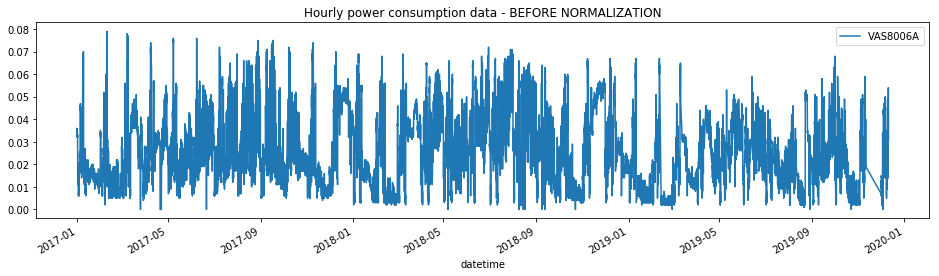

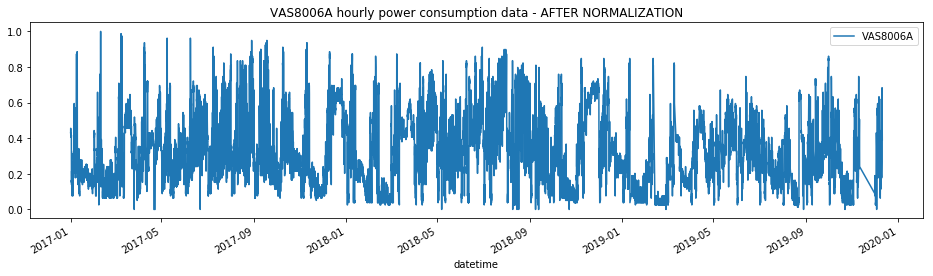

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_46 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_91 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_47 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_92 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_48 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_93 (Dropout)         (None, 40)                0         
_______

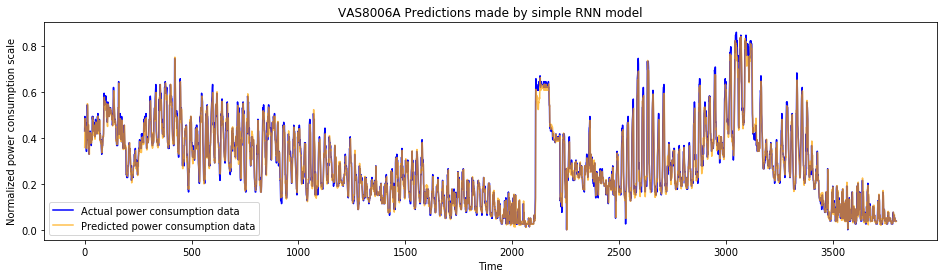

Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_46 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_94 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_47 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_95 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
lstm_48 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_96 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_32 (Dense)             (None, 1)               

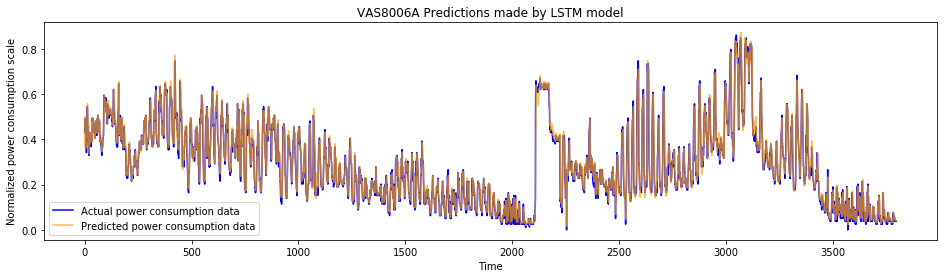

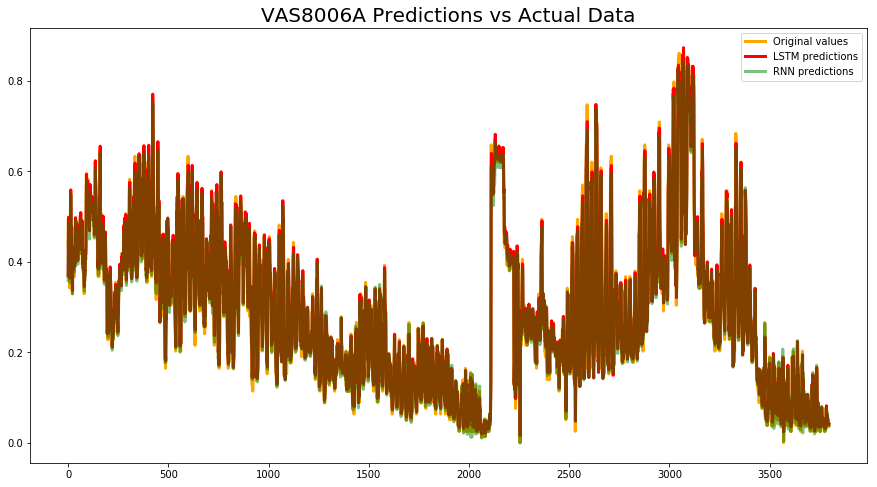

In [39]:
#dropping rows with missing data
VAS8006ADF = VAS8006ADF.dropna()
#checking missing data
VAS8006ADF.isna().sum()

#column data type formatting
VAS8006ADF.datetime = pd.to_datetime(VAS8006ADF.datetime)
VAS8006ADF.VAS8006A = pd.to_numeric(VAS8006ADF.VAS8006A)
VAS8006ADF.set_index(['datetime'], inplace = True)
VAS8006ADF.head()

#visualize data before normalization
VAS8006ADF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(VAS8006ADF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    VAS8006ADF['VAS8006A']=scaler.fit_transform(VAS8006ADF['VAS8006A'].values.reshape(-1,1))
    return VAS8006ADF
VAS8006ADF_norm = normalize_data(VAS8006ADF)
VAS8006ADF_norm.shape

#visualize data after normalization
VAS8006ADF_norm.plot(figsize=(16,4),legend=True)
plt.title('VAS8006A hourly power consumption data - AFTER NORMALIZATION')
plt.show()

VAS8006ADF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(VAS8006ADF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "VAS8006A Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "VAS8006A Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("VAS8006A Predictions vs Actual Data", fontsize=20)
plt.show()

In [40]:
# Univariate Analysis for VAS8006B

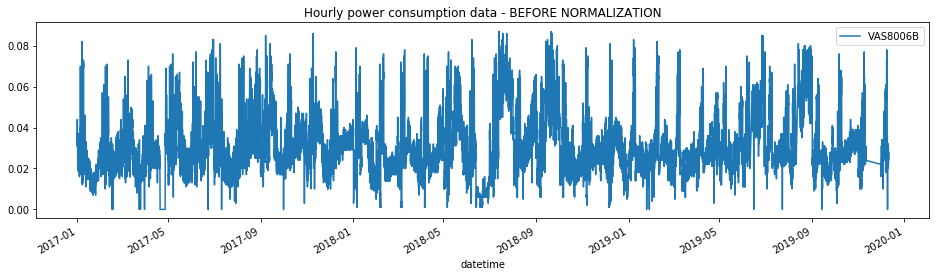

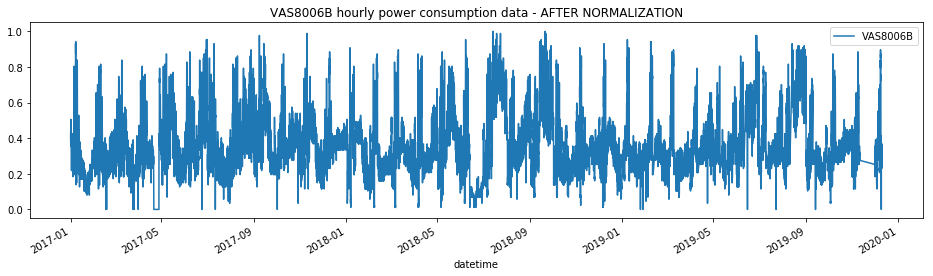

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_49 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_97 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_50 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_98 (Dropout)         (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_51 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_99 (Dropout)         (None, 40)                0         
_______

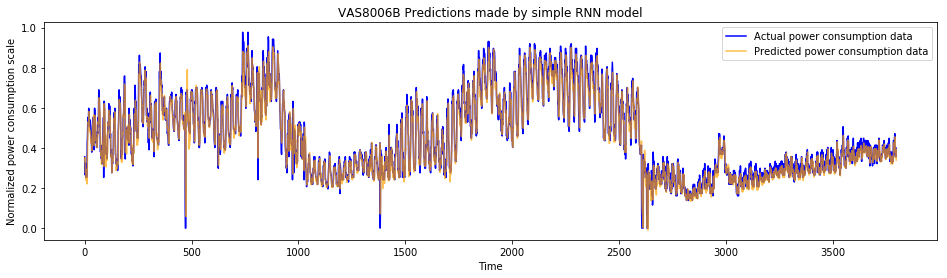

Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_49 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_100 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_50 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_101 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_51 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_102 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_34 (Dense)             (None, 1)               

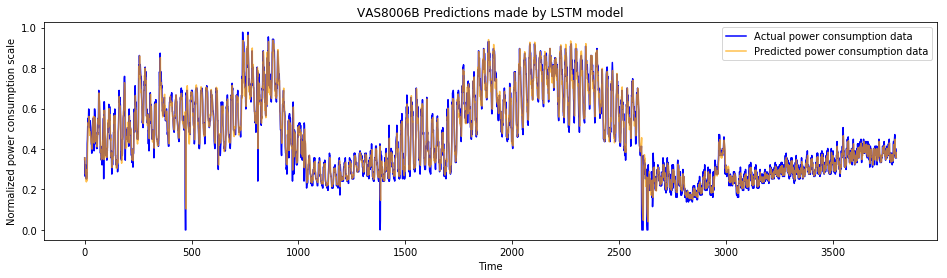

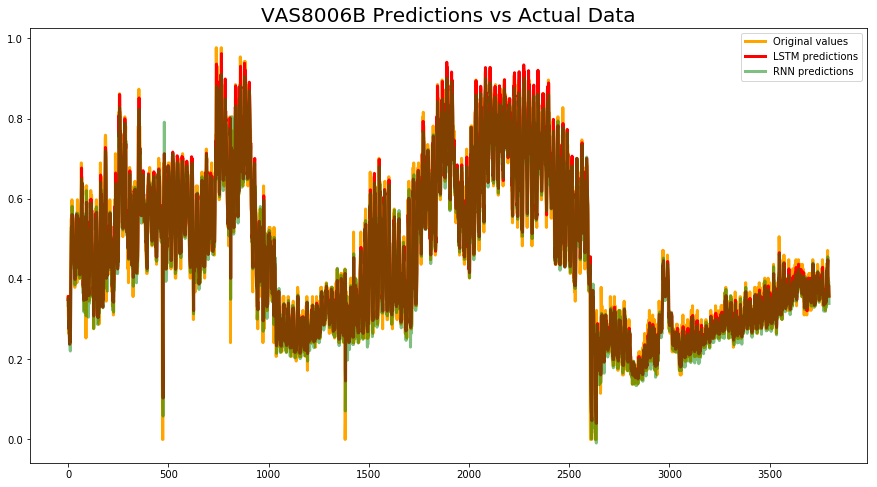

In [41]:
#dropping rows with missing data
VAS8006BDF = VAS8006BDF.dropna()
#checking missing data
VAS8006BDF.isna().sum()

#column data type formatting
VAS8006BDF.datetime = pd.to_datetime(VAS8006BDF.datetime)
VAS8006BDF.VAS8006B = pd.to_numeric(VAS8006BDF.VAS8006B)
VAS8006BDF.set_index(['datetime'], inplace = True)
VAS8006BDF.head()

#visualize data before normalization
VAS8006BDF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(VAS8006BDF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    VAS8006BDF['VAS8006B']=scaler.fit_transform(VAS8006BDF['VAS8006B'].values.reshape(-1,1))
    return VAS8006BDF
VAS8006BDF_norm = normalize_data(VAS8006BDF)
VAS8006BDF_norm.shape

#visualize data after normalization
VAS8006BDF_norm.plot(figsize=(16,4),legend=True)
plt.title('VAS8006B hourly power consumption data - AFTER NORMALIZATION')
plt.show()

VAS8006BDF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(VAS8006BDF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "VAS8006B Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "VAS8006B Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("VAS8006B Predictions vs Actual Data", fontsize=20)
plt.show()

In [42]:
# Univariate Analysis for VAS8006C

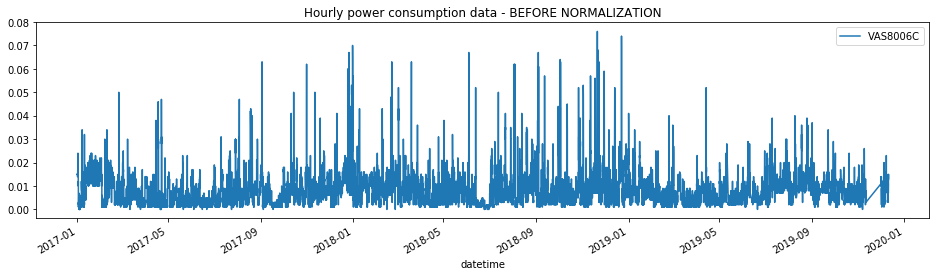

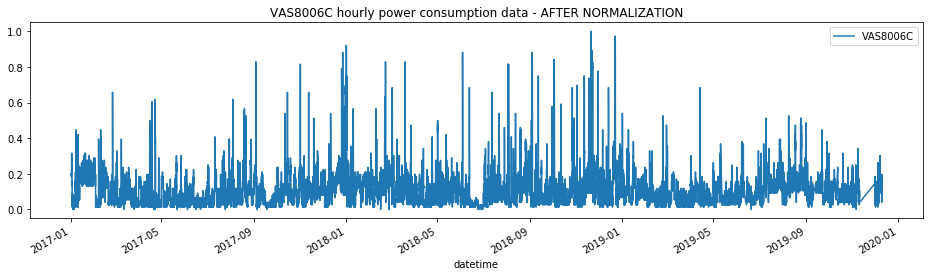

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_52 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_103 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_53 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_104 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_54 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_105 (Dropout)        (None, 40)                0         
_______

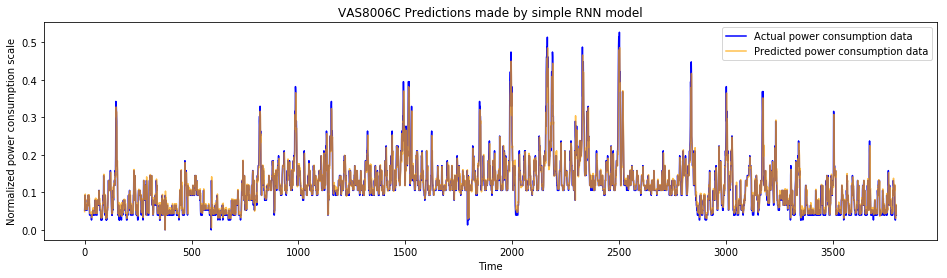

Model: "sequential_36"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_52 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_106 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_53 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_107 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_54 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_108 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_36 (Dense)             (None, 1)               

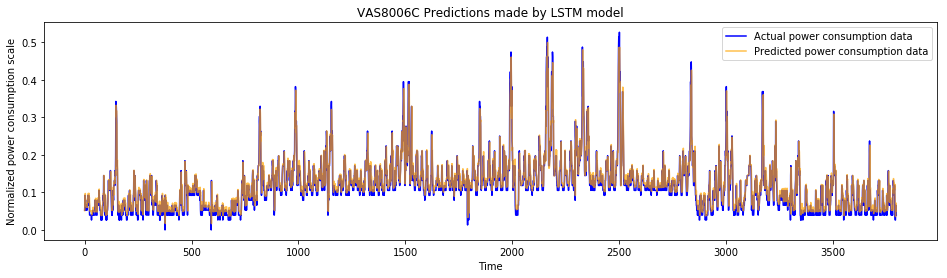

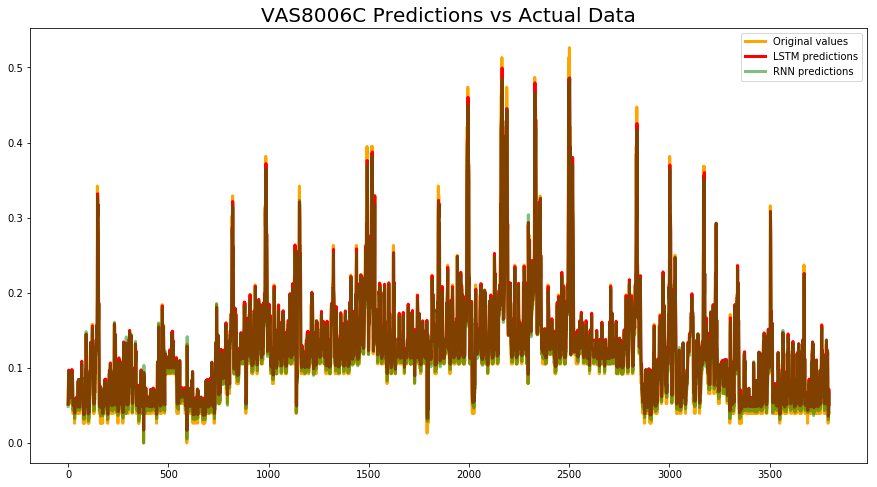

In [43]:
#dropping rows with missing data
VAS8006CDF = VAS8006CDF.dropna()
#checking missing data
VAS8006CDF.isna().sum()

#column data type formatting
VAS8006CDF.datetime = pd.to_datetime(VAS8006CDF.datetime)
VAS8006CDF.VAS8006C = pd.to_numeric(VAS8006CDF.VAS8006C)
VAS8006CDF.set_index(['datetime'], inplace = True)
VAS8006CDF.head()

#visualize data before normalization
VAS8006CDF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(VAS8006CDF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    VAS8006CDF['VAS8006C']=scaler.fit_transform(VAS8006CDF['VAS8006C'].values.reshape(-1,1))
    return VAS8006CDF
VAS8006CDF_norm = normalize_data(VAS8006CDF)
VAS8006CDF_norm.shape

#visualize data after normalization
VAS8006CDF_norm.plot(figsize=(16,4),legend=True)
plt.title('VAS8006C hourly power consumption data - AFTER NORMALIZATION')
plt.show()

VAS8006CDF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(VAS8006CDF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "VAS8006C Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "VAS8006C Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("VAS8006C Predictions vs Actual Data", fontsize=20)
plt.show()

In [44]:
# Univariate Analysis for LAS8006

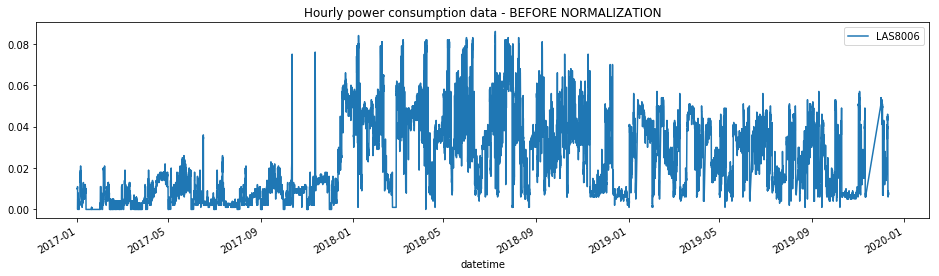

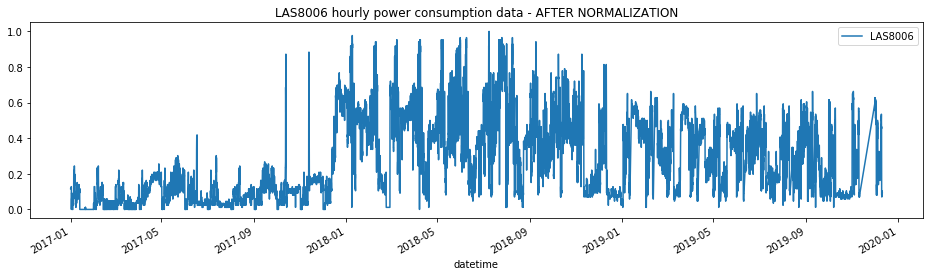

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_55 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_109 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_56 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_110 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_57 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_111 (Dropout)        (None, 40)                0         
_______

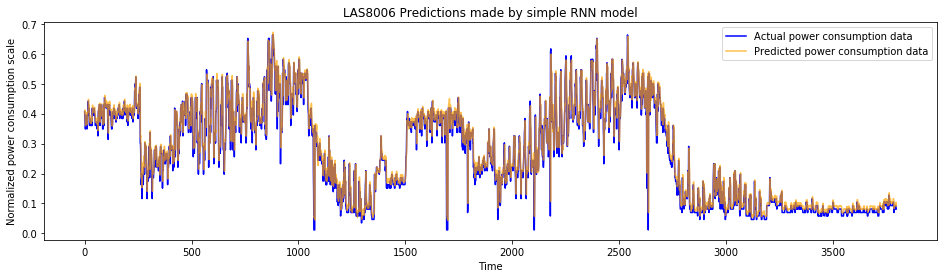

Model: "sequential_38"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_55 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_112 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_56 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_113 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_57 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_114 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_38 (Dense)             (None, 1)               

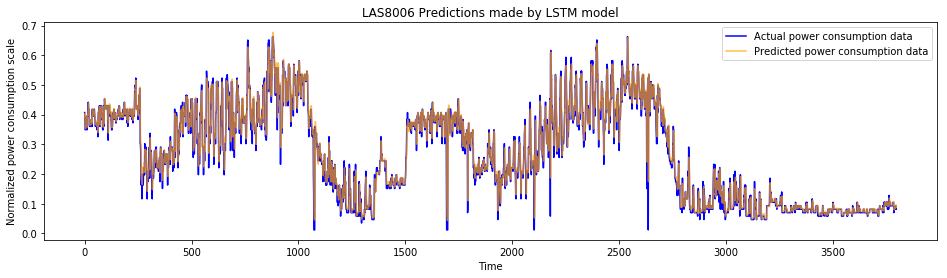

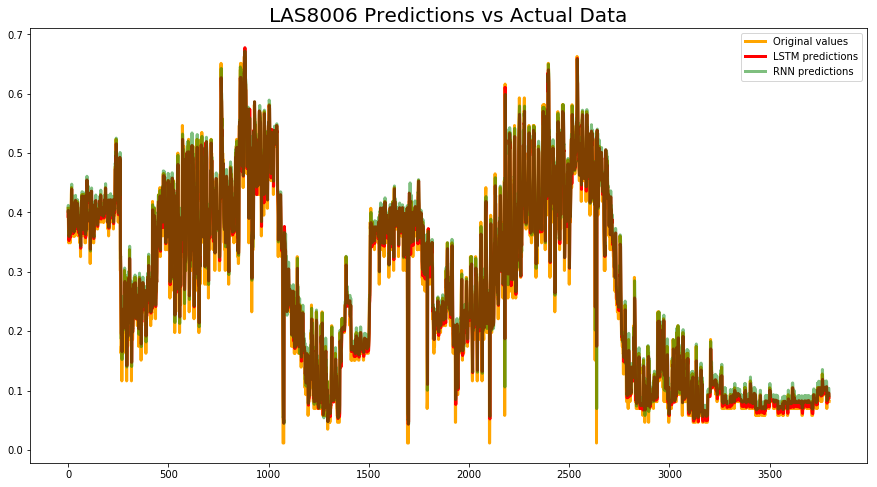

In [45]:
#dropping rows with missing data
LAS8006DF = LAS8006DF.dropna()
#checking missing data
LAS8006DF.isna().sum()

#column data type formatting
LAS8006DF.datetime = pd.to_datetime(LAS8006DF.datetime)
LAS8006DF.LAS8006 = pd.to_numeric(LAS8006DF.LAS8006)
LAS8006DF.set_index(['datetime'], inplace = True)
LAS8006DF.head()

#visualize data before normalization
LAS8006DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(LAS8006DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    LAS8006DF['LAS8006']=scaler.fit_transform(LAS8006DF['LAS8006'].values.reshape(-1,1))
    return LAS8006DF
LAS8006DF_norm = normalize_data(LAS8006DF)
LAS8006DF_norm.shape

#visualize data after normalization
LAS8006DF_norm.plot(figsize=(16,4),legend=True)
plt.title('LAS8006 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

LAS8006DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(LAS8006DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "LAS8006 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "LAS8006 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("LAS8006 Predictions vs Actual Data", fontsize=20)
plt.show()

In [46]:
# Univariate Analysis for VAS8006D

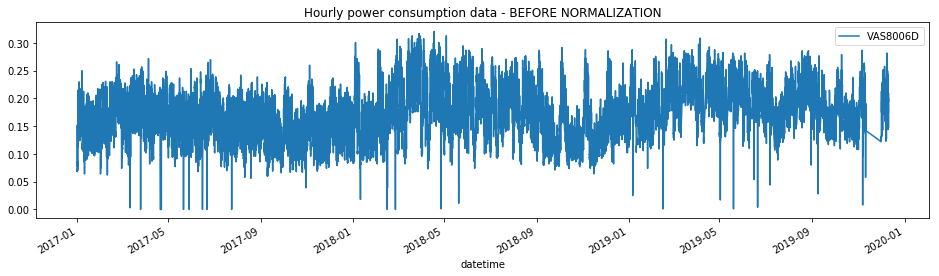

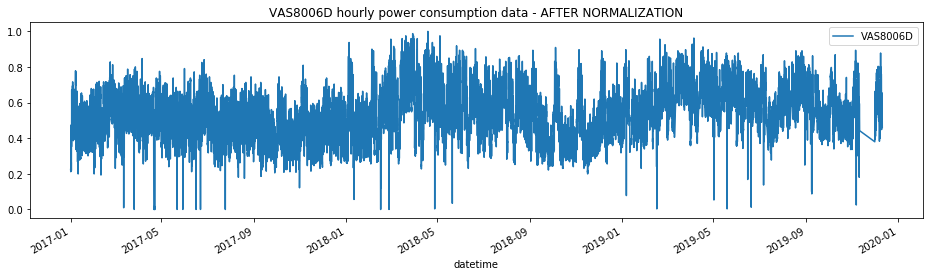

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_58 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_115 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_59 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_116 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_60 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_117 (Dropout)        (None, 40)                0         
_______

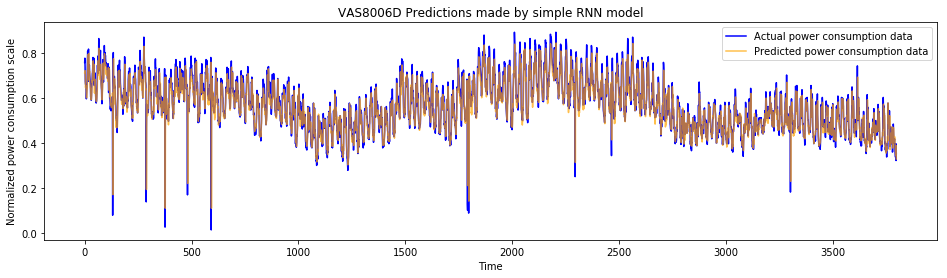

Model: "sequential_40"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_58 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_118 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_59 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_119 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_60 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_120 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_40 (Dense)             (None, 1)               

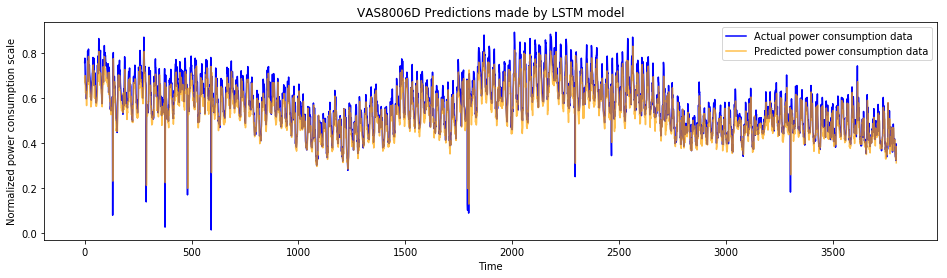

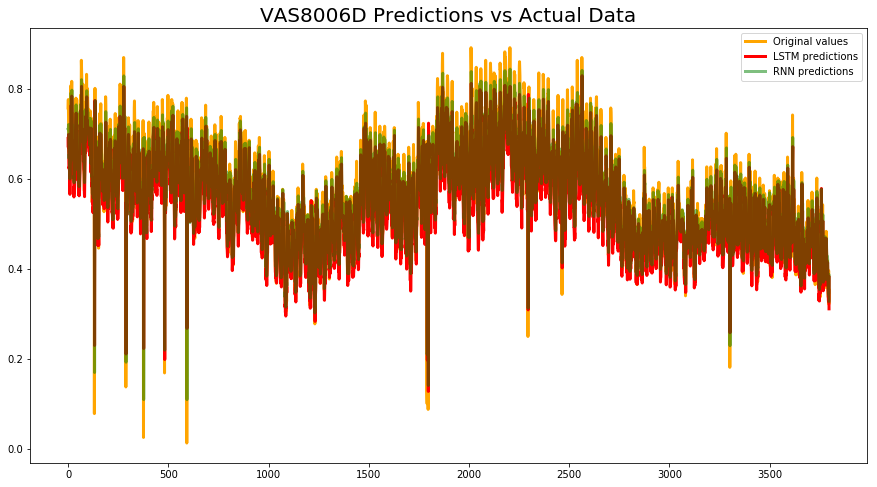

In [47]:
#dropping rows with missing data
VAS8006DDF = VAS8006DDF.dropna()
#checking missing data
VAS8006DDF.isna().sum()

#column data type formatting
VAS8006DDF.datetime = pd.to_datetime(VAS8006DDF.datetime)
VAS8006DDF.VAS8006D = pd.to_numeric(VAS8006DDF.VAS8006D)
VAS8006DDF.set_index(['datetime'], inplace = True)
VAS8006DDF.head()

#visualize data before normalization
VAS8006DDF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(VAS8006DDF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    VAS8006DDF['VAS8006D']=scaler.fit_transform(VAS8006DDF['VAS8006D'].values.reshape(-1,1))
    return VAS8006DDF
VAS8006DDF_norm = normalize_data(VAS8006DDF)
VAS8006DDF_norm.shape

#visualize data after normalization
VAS8006DDF_norm.plot(figsize=(16,4),legend=True)
plt.title('VAS8006D hourly power consumption data - AFTER NORMALIZATION')
plt.show()

VAS8006DDF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(VAS8006DDF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "VAS8006D Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "VAS8006D Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("VAS8006D Predictions vs Actual Data", fontsize=20)
plt.show()

In [48]:
# Univariate Analysis for VAS8006E

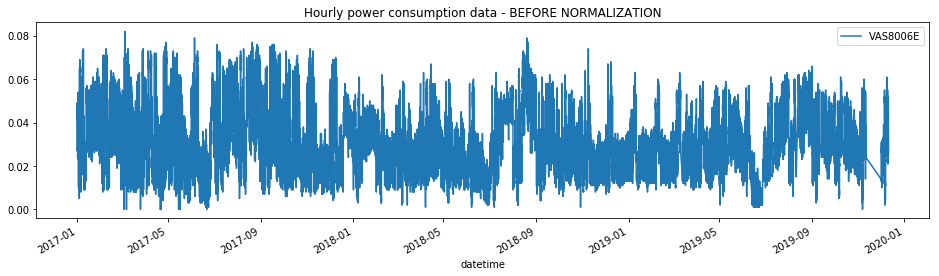

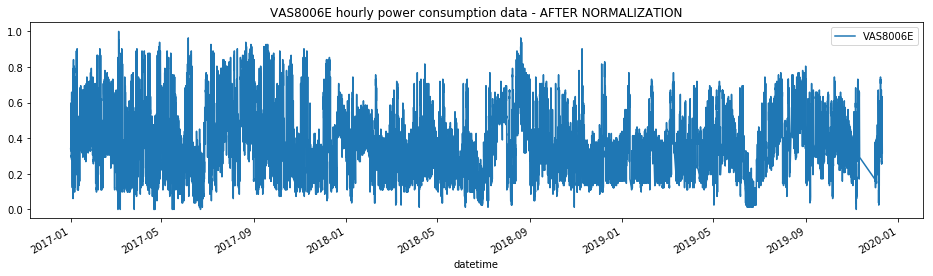

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_61 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_121 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_62 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_122 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_63 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_123 (Dropout)        (None, 40)                0         
_______

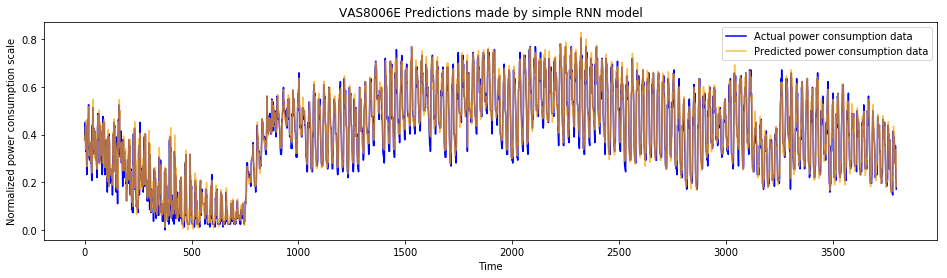

Model: "sequential_42"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_61 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_124 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_62 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_125 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_63 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_126 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_42 (Dense)             (None, 1)               

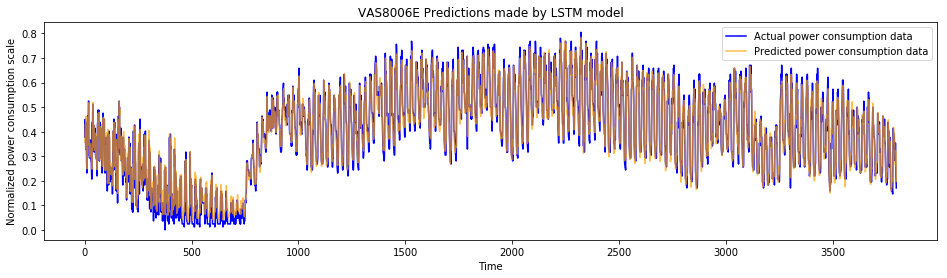

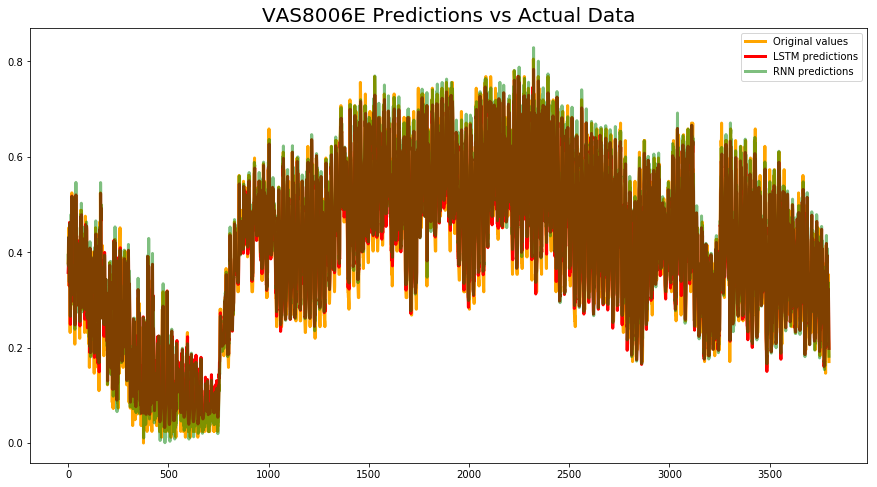

In [49]:
#dropping rows with missing data
VAS8006EDF = VAS8006EDF.dropna()
#checking missing data
VAS8006EDF.isna().sum()

#column data type formatting
VAS8006EDF.datetime = pd.to_datetime(VAS8006EDF.datetime)
VAS8006EDF.VAS8006E = pd.to_numeric(VAS8006EDF.VAS8006E)
VAS8006EDF.set_index(['datetime'], inplace = True)
VAS8006EDF.head()

#visualize data before normalization
VAS8006EDF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(VAS8006EDF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    VAS8006EDF['VAS8006E']=scaler.fit_transform(VAS8006EDF['VAS8006E'].values.reshape(-1,1))
    return VAS8006EDF
VAS8006EDF_norm = normalize_data(VAS8006EDF)
VAS8006EDF_norm.shape

#visualize data after normalization
VAS8006EDF_norm.plot(figsize=(16,4),legend=True)
plt.title('VAS8006E hourly power consumption data - AFTER NORMALIZATION')
plt.show()

VAS8006EDF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(VAS8006EDF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "VAS8006E Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "VAS8006E Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("VAS8006E Predictions vs Actual Data", fontsize=20)
plt.show()

In [50]:
# Univariate Analysis for VAS8006F

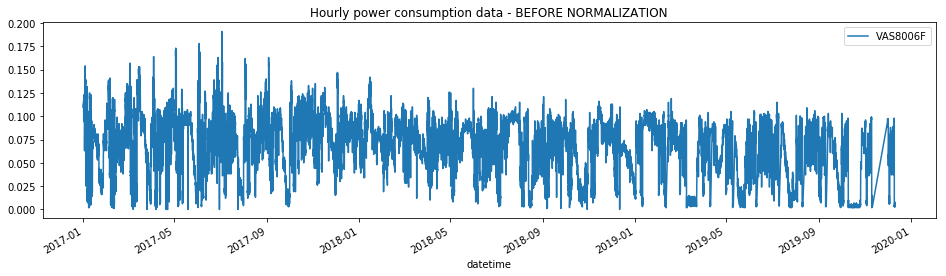

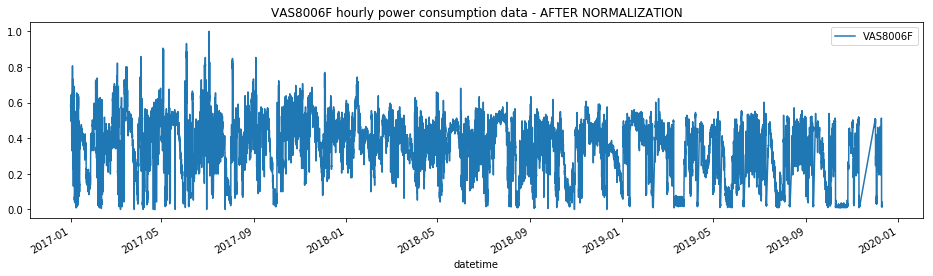

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_43"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_64 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_127 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_65 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_128 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_66 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_129 (Dropout)        (None, 40)                0         
_______

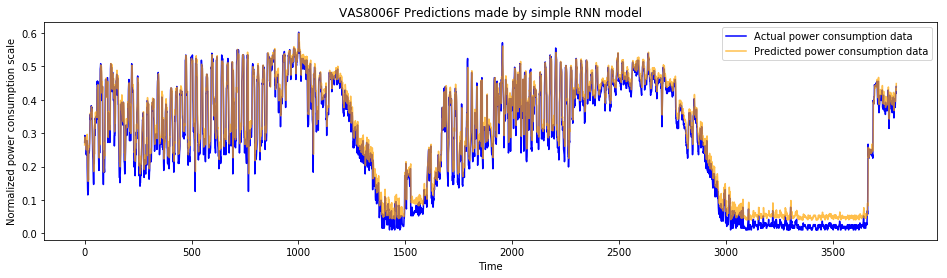

Model: "sequential_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_64 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_130 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_65 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_131 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_66 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_132 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_44 (Dense)             (None, 1)               

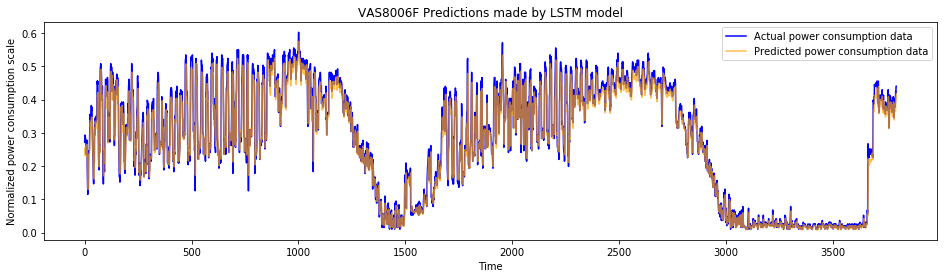

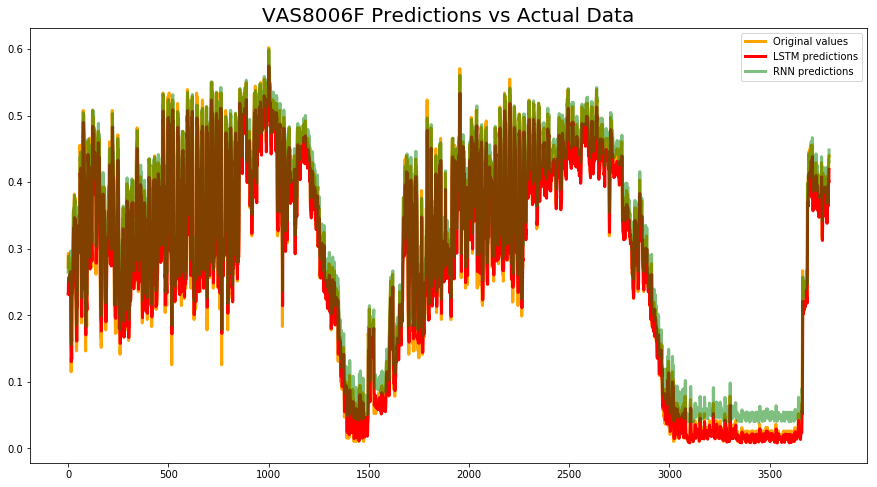

In [51]:
#dropping rows with missing data
VAS8006FDF = VAS8006FDF.dropna()
#checking missing data
VAS8006FDF.isna().sum()

#column data type formatting
VAS8006FDF.datetime = pd.to_datetime(VAS8006FDF.datetime)
VAS8006FDF.VAS8006F = pd.to_numeric(VAS8006FDF.VAS8006F)
VAS8006FDF.set_index(['datetime'], inplace = True)
VAS8006FDF.head()

#visualize data before normalization
VAS8006FDF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(VAS8006FDF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    VAS8006FDF['VAS8006F']=scaler.fit_transform(VAS8006FDF['VAS8006F'].values.reshape(-1,1))
    return VAS8006FDF
VAS8006FDF_norm = normalize_data(VAS8006FDF)
VAS8006FDF_norm.shape

#visualize data after normalization
VAS8006FDF_norm.plot(figsize=(16,4),legend=True)
plt.title('VAS8006F hourly power consumption data - AFTER NORMALIZATION')
plt.show()

VAS8006FDF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(VAS8006FDF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "VAS8006F Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "VAS8006F Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("VAS8006F Predictions vs Actual Data", fontsize=20)
plt.show()

In [52]:
# Univariate Analysis for VAS8009

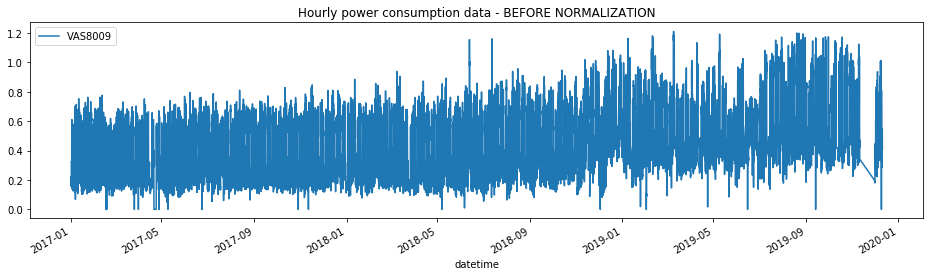

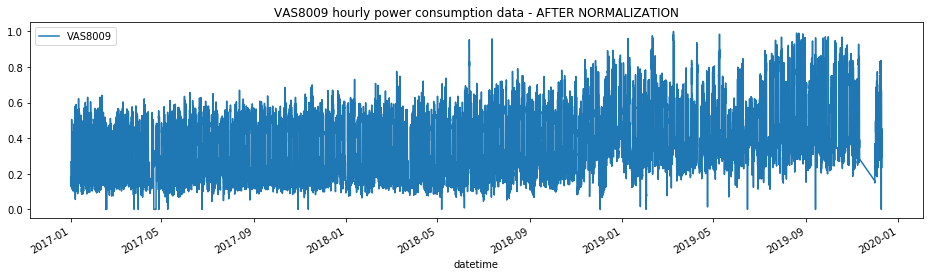

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_67 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_133 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_68 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_134 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_69 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_135 (Dropout)        (None, 40)                0         
_______

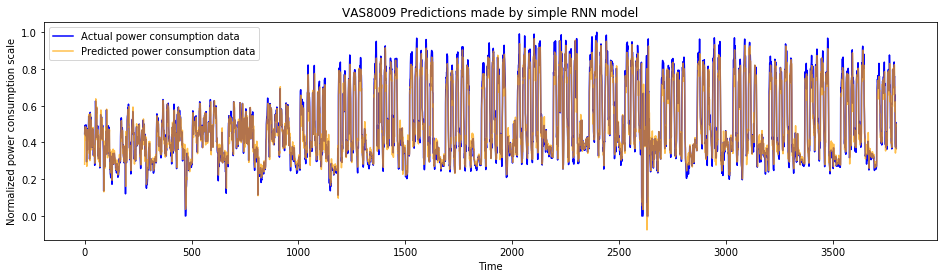

Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_67 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_136 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_68 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_137 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_69 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_138 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_46 (Dense)             (None, 1)               

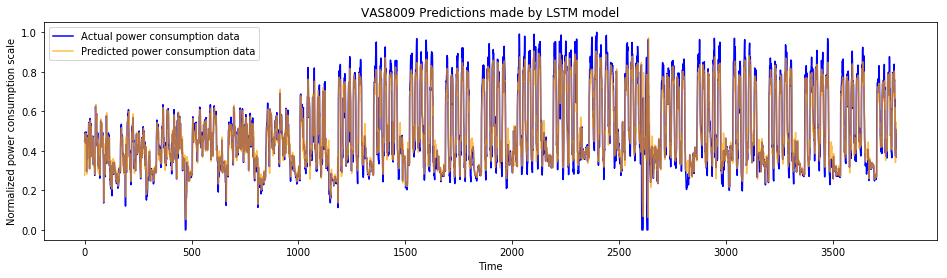

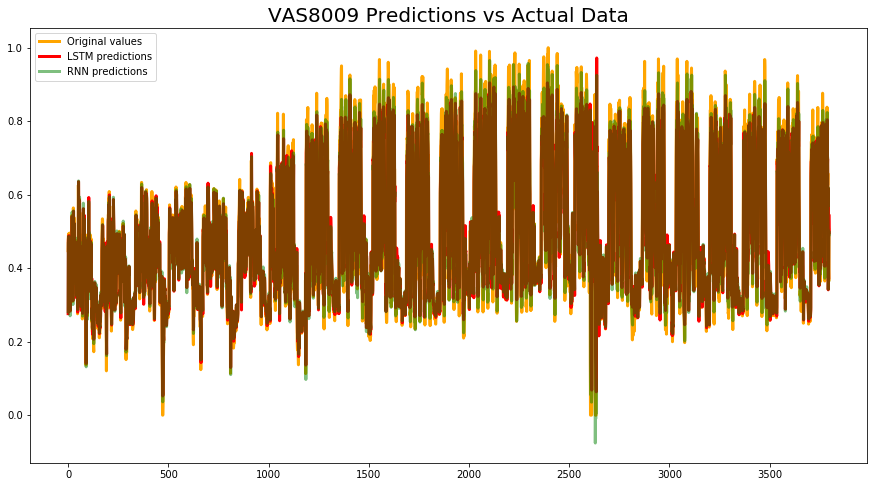

In [53]:
#dropping rows with missing data
VAS8009DF = VAS8009DF.dropna()
#checking missing data
VAS8009DF.isna().sum()

#column data type formatting
VAS8009DF.datetime = pd.to_datetime(VAS8009DF.datetime)
VAS8009DF.VAS8009 = pd.to_numeric(VAS8009DF.VAS8009)
VAS8009DF.set_index(['datetime'], inplace = True)
VAS8009DF.head()

#visualize data before normalization
VAS8009DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(VAS8009DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    VAS8009DF['VAS8009']=scaler.fit_transform(VAS8009DF['VAS8009'].values.reshape(-1,1))
    return VAS8009DF
VAS8009DF_norm = normalize_data(VAS8009DF)
VAS8009DF_norm.shape

#visualize data after normalization
VAS8009DF_norm.plot(figsize=(16,4),legend=True)
plt.title('VAS8009 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

VAS8009DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(VAS8009DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)

#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "VAS8009 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "VAS8009 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("VAS8009 Predictions vs Actual Data", fontsize=20)
plt.show()

In [54]:
# Univariate Analysis for VAS8006G

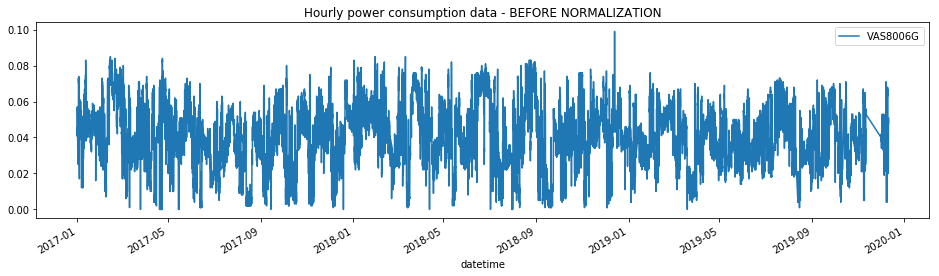

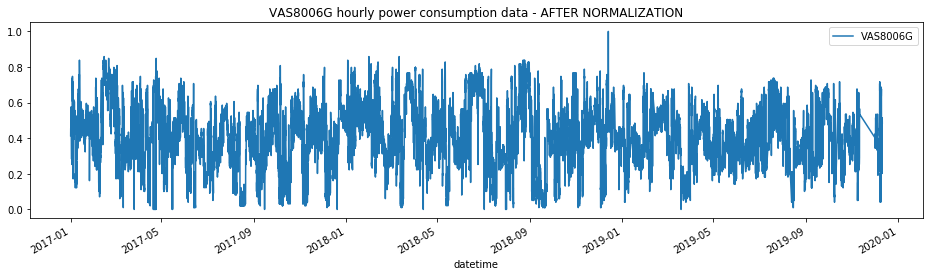

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_70 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_139 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_71 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_140 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_72 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_141 (Dropout)        (None, 40)                0         
_______

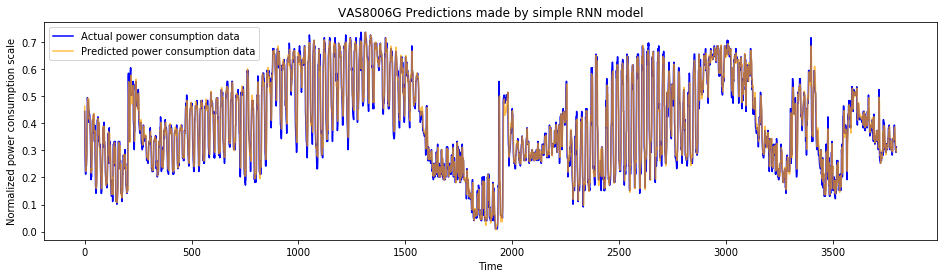

Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_70 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_142 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_71 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_143 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_72 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_144 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_48 (Dense)             (None, 1)               

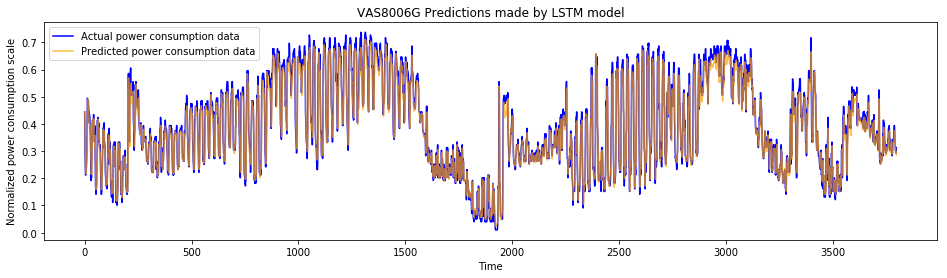

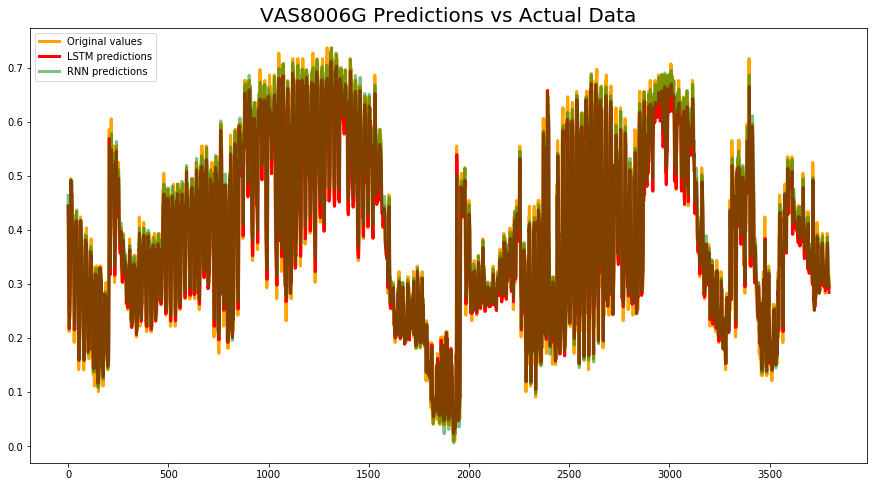

In [55]:
#dropping rows with missing data
VAS8006GDF = VAS8006GDF.dropna()
#checking missing data
VAS8006GDF.isna().sum()

#column data type formatting
VAS8006GDF.datetime = pd.to_datetime(VAS8006GDF.datetime)
VAS8006GDF.VAS8006G = pd.to_numeric(VAS8006GDF.VAS8006G)
VAS8006GDF.set_index(['datetime'], inplace = True)
VAS8006GDF.head()

#visualize data before normalization
VAS8006GDF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(VAS8006GDF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    VAS8006GDF['VAS8006G']=scaler.fit_transform(VAS8006GDF['VAS8006G'].values.reshape(-1,1))
    return VAS8006GDF
VAS8006GDF_norm = normalize_data(VAS8006GDF)
VAS8006GDF_norm.shape

#visualize data after normalization
VAS8006GDF_norm.plot(figsize=(16,4),legend=True)
plt.title('VAS8006G hourly power consumption data - AFTER NORMALIZATION')
plt.show()

VAS8006GDF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(VAS8006GDF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "VAS8006G Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "VAS8006G Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("VAS8006G Predictions vs Actual Data", fontsize=20)
plt.show()

In [56]:
# Univariate Analysis for VAS8010

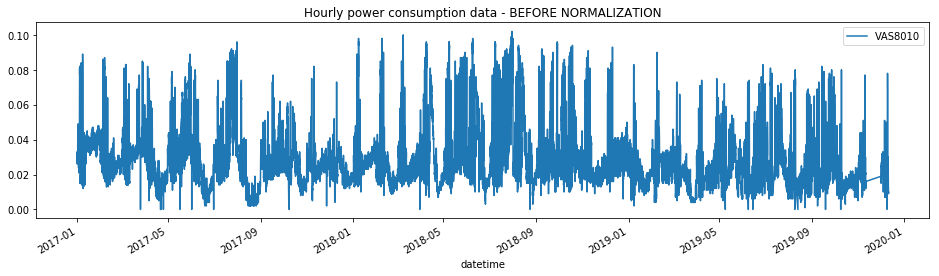

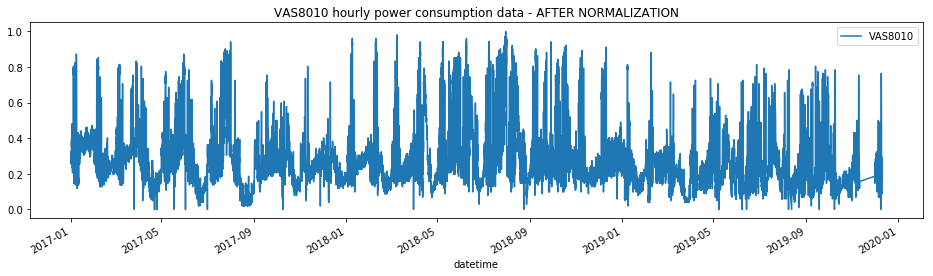

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_73 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_145 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_74 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_146 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_75 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_147 (Dropout)        (None, 40)                0         
_______

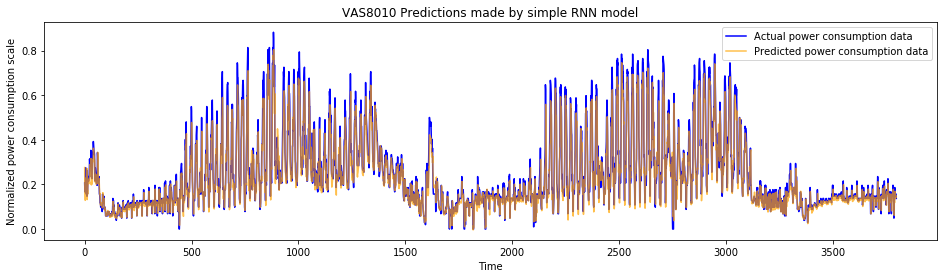

Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_73 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_148 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_74 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_149 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_75 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_150 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_50 (Dense)             (None, 1)               

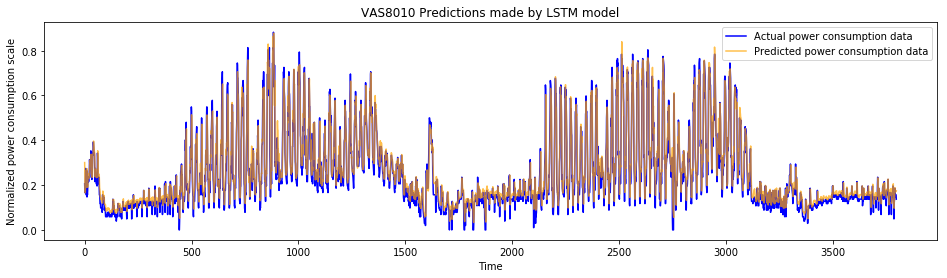

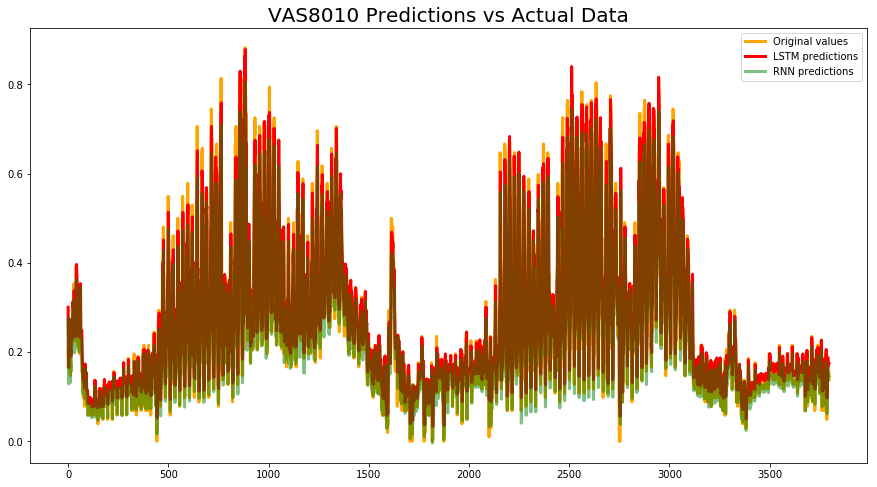

In [57]:
#dropping rows with missing data
VAS8010DF = VAS8010DF.dropna()
#checking missing data
VAS8010DF.isna().sum()

#column data type formatting
VAS8010DF.datetime = pd.to_datetime(VAS8010DF.datetime)
VAS8010DF.VAS8010 = pd.to_numeric(VAS8010DF.VAS8010)
VAS8010DF.set_index(['datetime'], inplace = True)
VAS8010DF.head()

#visualize data before normalization
VAS8010DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(VAS8010DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    VAS8010DF['VAS8010']=scaler.fit_transform(VAS8010DF['VAS8010'].values.reshape(-1,1))
    return VAS8010DF
VAS8010DF_norm = normalize_data(VAS8010DF)
VAS8010DF_norm.shape

#visualize data after normalization
VAS8010DF_norm.plot(figsize=(16,4),legend=True)
plt.title('VAS8010 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

VAS8010DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(VAS8010DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "VAS8010 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "VAS8010 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("VAS8010 Predictions vs Actual Data", fontsize=20)
plt.show()

In [58]:
# Univariate Analysis for VAS8011

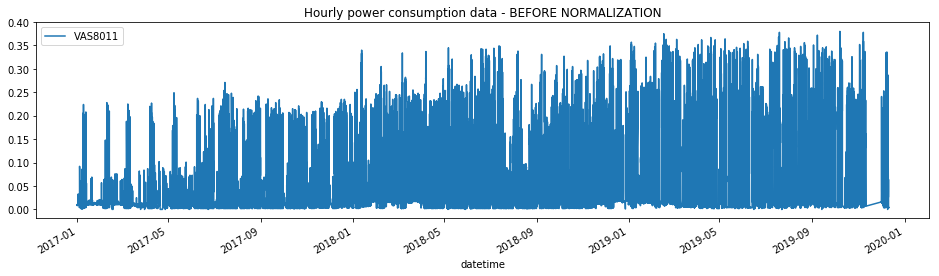

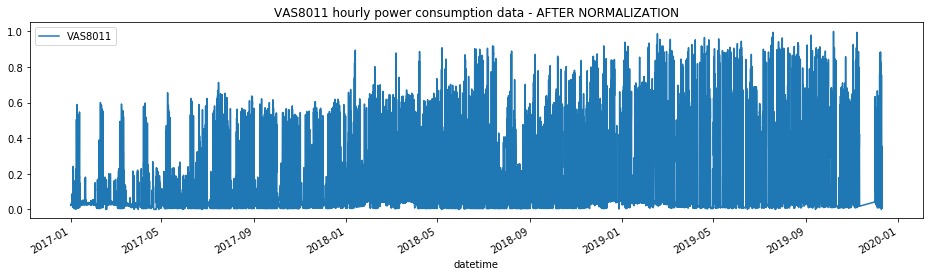

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_76 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_151 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_77 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_152 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_78 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_153 (Dropout)        (None, 40)                0         
_______

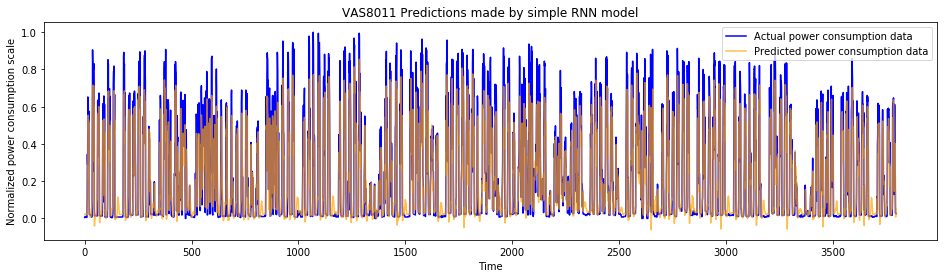

Model: "sequential_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_76 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_154 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_77 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_155 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_78 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_156 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_52 (Dense)             (None, 1)               

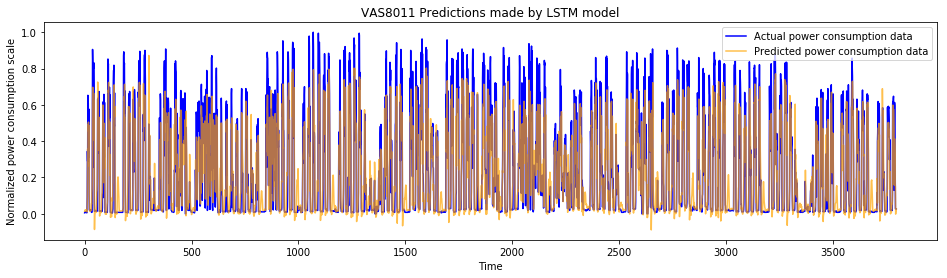

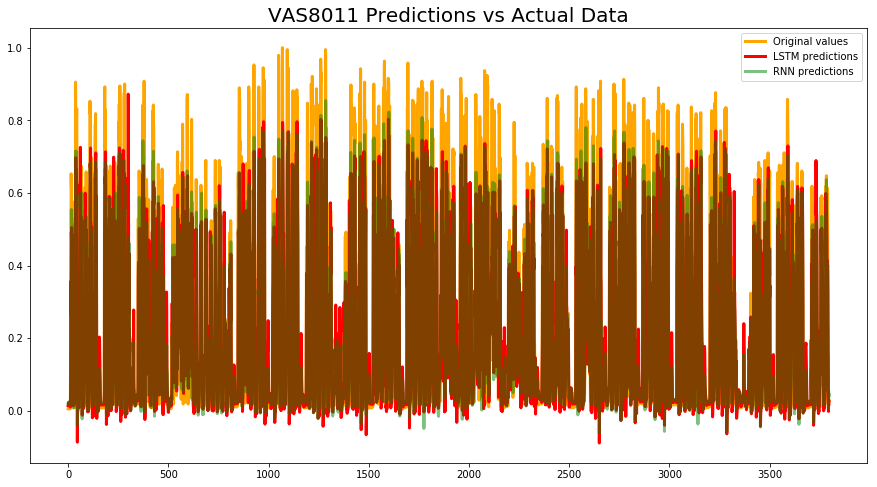

In [59]:
#dropping rows with missing data
VAS8011DF = VAS8011DF.dropna()
#checking missing data
VAS8011DF.isna().sum()

#column data type formatting
VAS8011DF.datetime = pd.to_datetime(VAS8011DF.datetime)
VAS8011DF.VAS8011 = pd.to_numeric(VAS8011DF.VAS8011)
VAS8011DF.set_index(['datetime'], inplace = True)
VAS8011DF.head()

#visualize data before normalization
VAS8011DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(VAS8011DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    VAS8011DF['VAS8011']=scaler.fit_transform(VAS8011DF['VAS8011'].values.reshape(-1,1))
    return VAS8011DF
VAS8011DF_norm = normalize_data(VAS8011DF)
VAS8011DF_norm.shape

#visualize data after normalization
VAS8011DF_norm.plot(figsize=(16,4),legend=True)
plt.title('VAS8011 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

VAS8011DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(VAS8011DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "VAS8011 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "VAS8011 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("VAS8011 Predictions vs Actual Data", fontsize=20)
plt.show()

In [60]:
# Univariate Analysis for CON9012

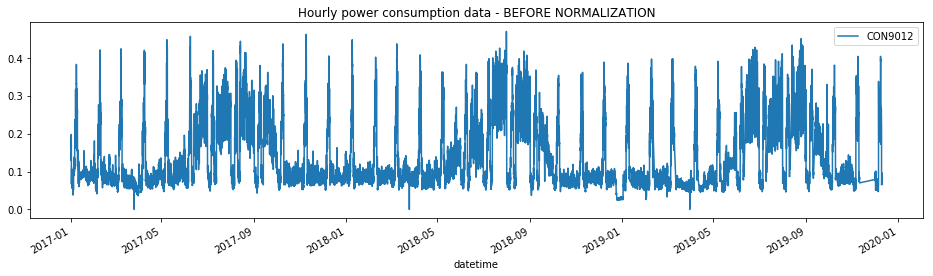

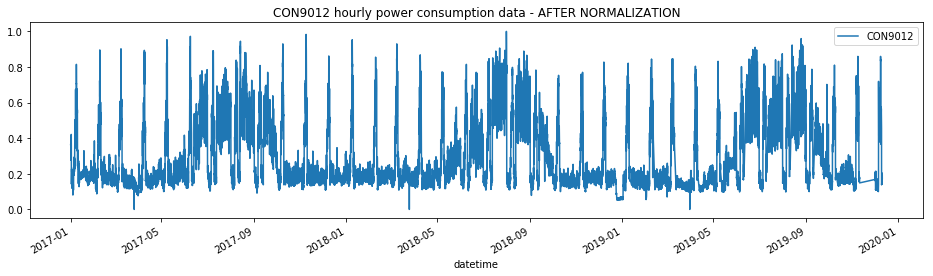

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3797, 20, 1)
y_test.shape =  (3797,)
Model: "sequential_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_79 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_157 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_80 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_158 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_81 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_159 (Dropout)        (None, 40)                0         
_______

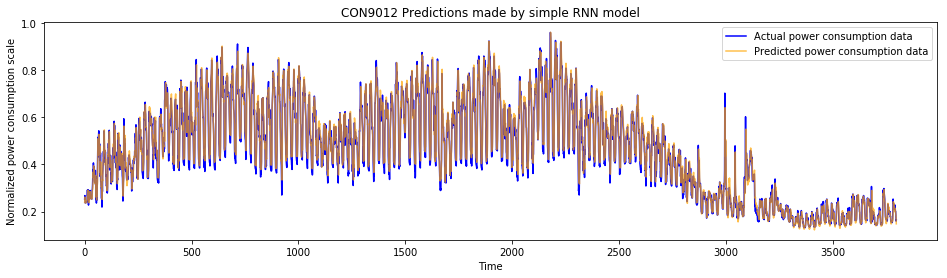

Model: "sequential_54"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_79 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_160 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_80 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_161 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_81 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_162 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_54 (Dense)             (None, 1)               

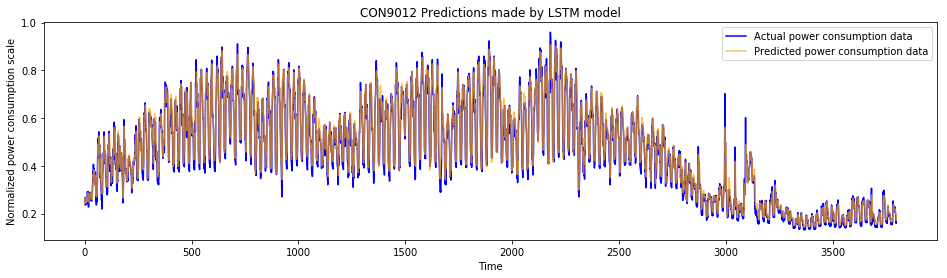

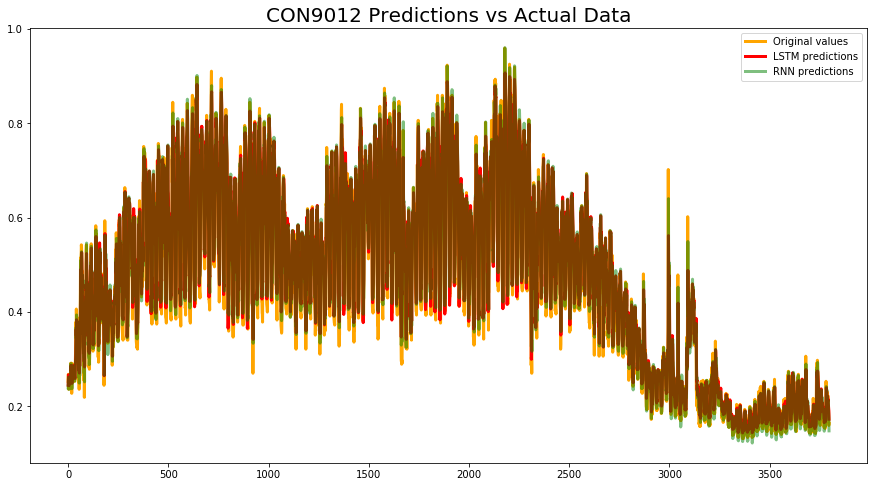

In [61]:
#dropping rows with missing data
CON9012DF = CON9012DF.dropna()
#checking missing data
CON9012DF.isna().sum()

#column data type formatting
CON9012DF.datetime = pd.to_datetime(CON9012DF.datetime)
CON9012DF.CON9012 = pd.to_numeric(CON9012DF.CON9012)
CON9012DF.set_index(['datetime'], inplace = True)
CON9012DF.head()

#visualize data before normalization
CON9012DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(CON9012DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    CON9012DF['CON9012']=scaler.fit_transform(CON9012DF['CON9012'].values.reshape(-1,1))
    return CON9012DF
CON9012DF_norm = normalize_data(CON9012DF)
CON9012DF_norm.shape

#visualize data after normalization
CON9012DF_norm.plot(figsize=(16,4),legend=True)
plt.title('CON9012 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

CON9012DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(CON9012DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "CON9012 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "CON9012 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("CON9012 Predictions vs Actual Data", fontsize=20)zs
plt.show()

In [62]:
# Univariate Analysis for ARG1006

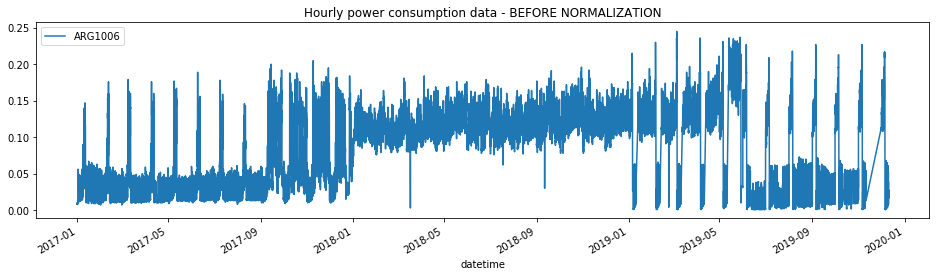

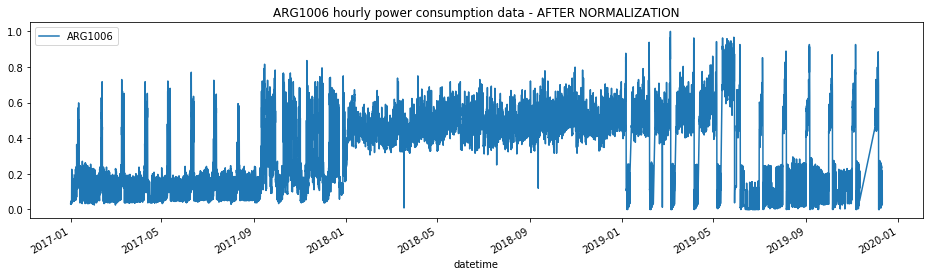

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3796, 20, 1)
y_test.shape =  (3796,)
Model: "sequential_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_82 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_163 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_83 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_164 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_84 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_165 (Dropout)        (None, 40)                0         
_______

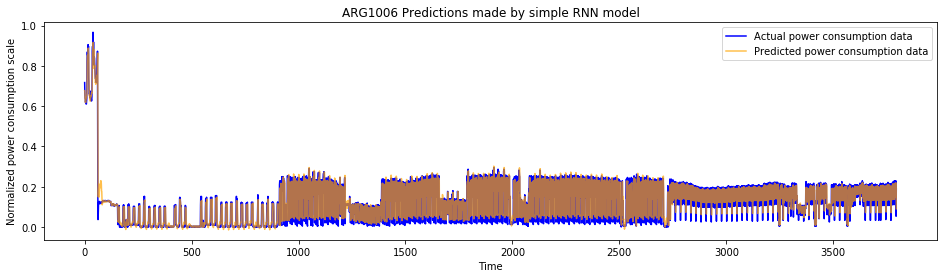

Model: "sequential_56"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_82 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_166 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_83 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_167 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_84 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_168 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_56 (Dense)             (None, 1)               

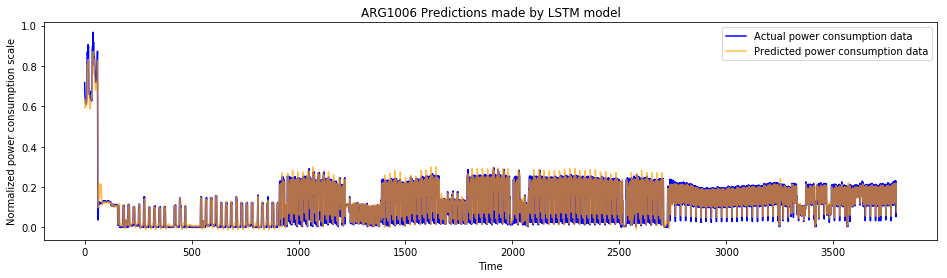

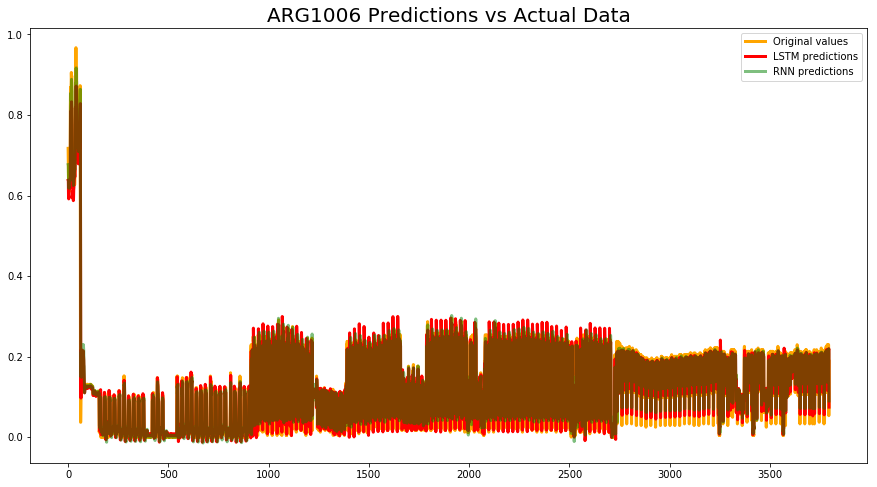

In [63]:
#dropping rows with missing data
ARG1006DF = ARG1006DF.dropna()
#checking missing data
ARG1006DF.isna().sum()

#column data type formatting
ARG1006DF.datetime = pd.to_datetime(ARG1006DF.datetime)
ARG1006DF.ARG1006 = pd.to_numeric(ARG1006DF.ARG1006)
ARG1006DF.set_index(['datetime'], inplace = True)
ARG1006DF.head()

#visualize data before normalization
ARG1006DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(ARG1006DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    ARG1006DF['ARG1006']=scaler.fit_transform(ARG1006DF['ARG1006'].values.reshape(-1,1))
    return ARG1006DF
ARG1006DF_norm = normalize_data(ARG1006DF)
ARG1006DF_norm.shape

#visualize data after normalization
ARG1006DF_norm.plot(figsize=(16,4),legend=True)
plt.title('ARG1006 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

ARG1006DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(ARG1006DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "ARG1006 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "ARG1006 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("ARG1006 Predictions vs Actual Data", fontsize=20)
plt.show()

In [64]:
# Univariate Analysis for ARG1013

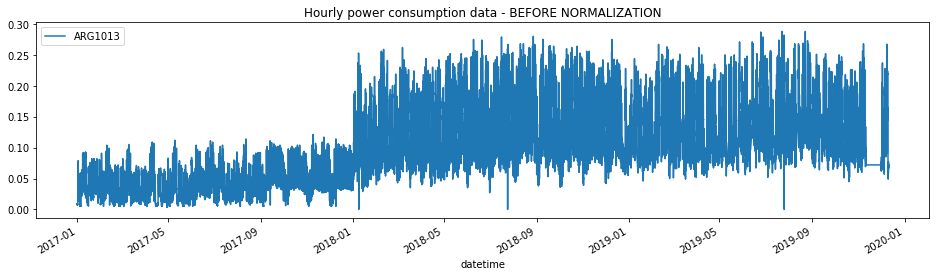

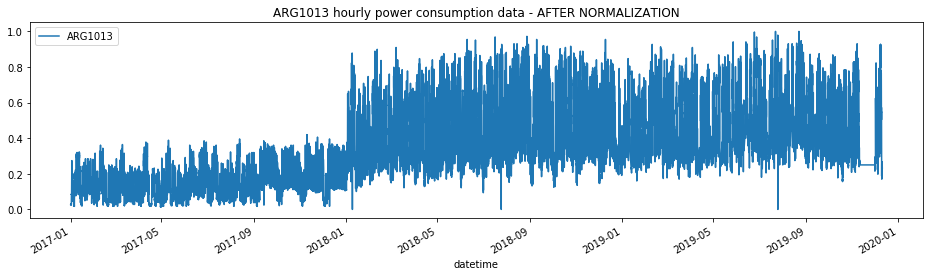

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3796, 20, 1)
y_test.shape =  (3796,)
Model: "sequential_57"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_85 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_169 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_86 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_170 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_87 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_171 (Dropout)        (None, 40)                0         
_______

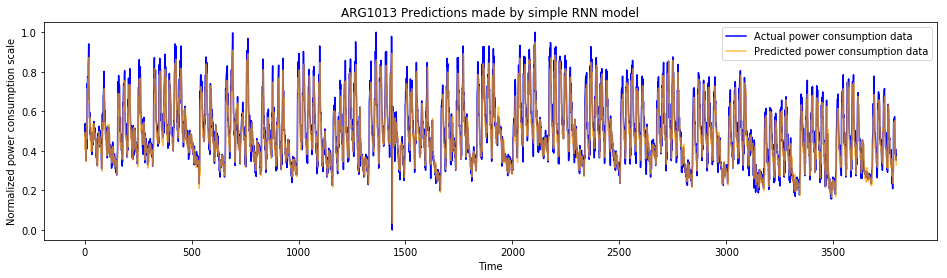

Model: "sequential_58"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_85 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_172 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_86 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_173 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_87 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_174 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_58 (Dense)             (None, 1)               

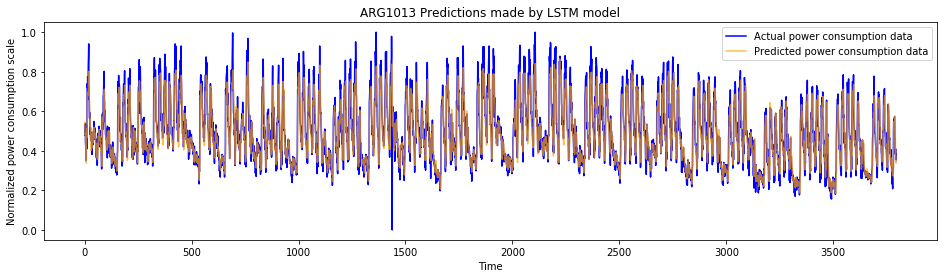

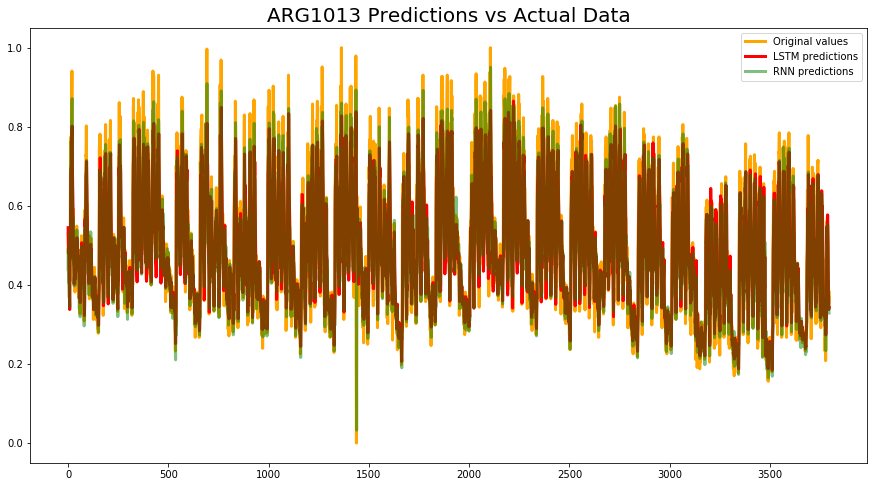

In [65]:
#dropping rows with missing data
ARG1013DF = ARG1013DF.dropna()
#checking missing data
ARG1013DF.isna().sum()

#column data type formatting
ARG1013DF.datetime = pd.to_datetime(ARG1013DF.datetime)
ARG1013DF.ARG1013 = pd.to_numeric(ARG1013DF.ARG1013)
ARG1013DF.set_index(['datetime'], inplace = True)
ARG1013DF.head()

#visualize data before normalization
ARG1013DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(ARG1013DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    ARG1013DF['ARG1013']=scaler.fit_transform(ARG1013DF['ARG1013'].values.reshape(-1,1))
    return ARG1013DF
ARG1013DF_norm = normalize_data(ARG1013DF)
ARG1013DF_norm.shape

#visualize data after normalization
ARG1013DF_norm.plot(figsize=(16,4),legend=True)
plt.title('ARG1013 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

ARG1013DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(ARG1013DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "ARG1013 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "ARG1013 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("ARG1013 Predictions vs Actual Data", fontsize=20)
plt.show()

In [66]:
# Univariate Analysis for ARG1014

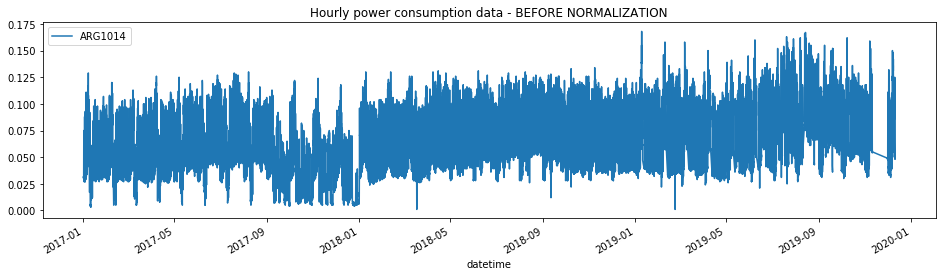

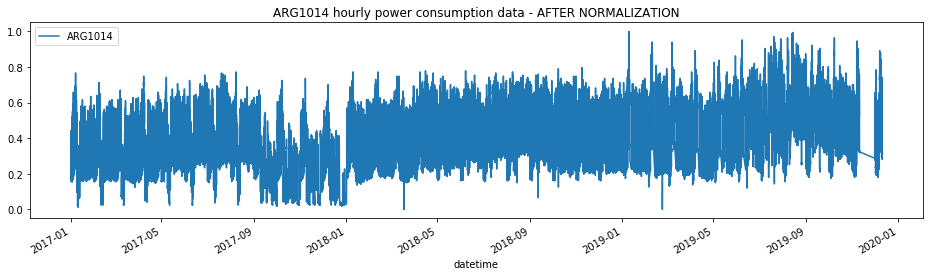

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3796, 20, 1)
y_test.shape =  (3796,)
Model: "sequential_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_88 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_175 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_89 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_176 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_90 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_177 (Dropout)        (None, 40)                0         
_______

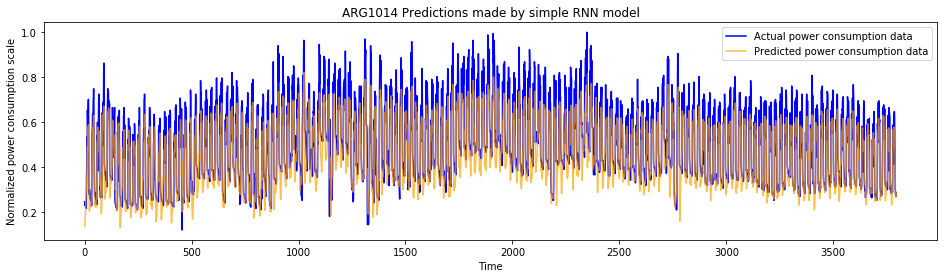

Model: "sequential_60"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_88 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_178 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_89 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_179 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_90 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_180 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_60 (Dense)             (None, 1)               

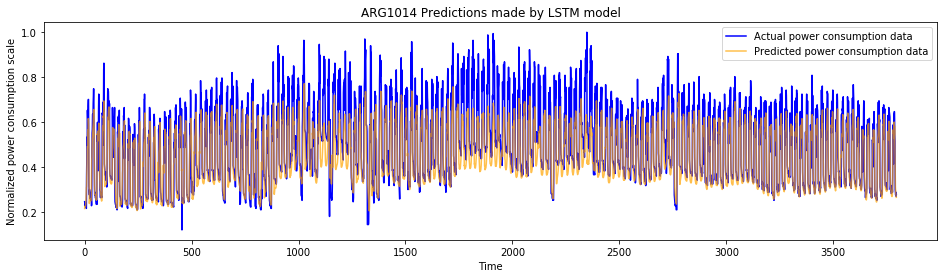

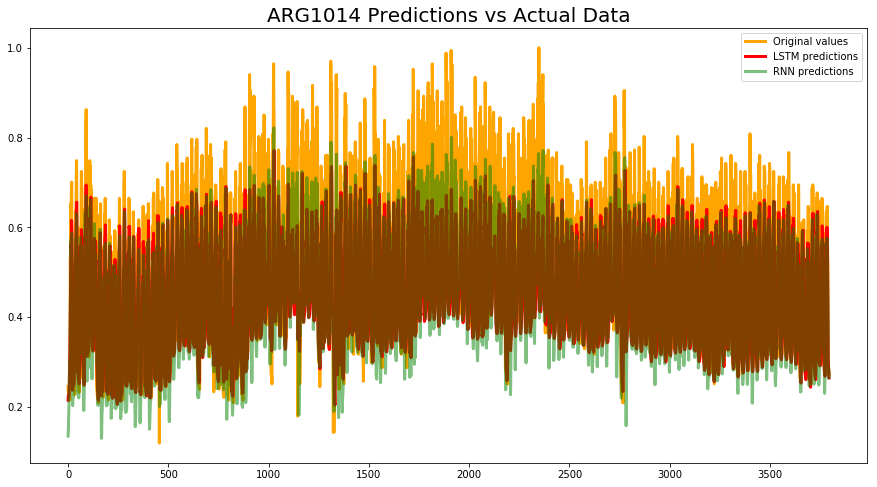

In [67]:
#dropping rows with missing data
ARG1014DF = ARG1014DF.dropna()
#checking missing data
ARG1014DF.isna().sum()

#column data type formatting
ARG1014DF.datetime = pd.to_datetime(ARG1014DF.datetime)
ARG1014DF.ARG1014 = pd.to_numeric(ARG1014DF.ARG1014)
ARG1014DF.set_index(['datetime'], inplace = True)
ARG1014DF.head()

#visualize data before normalization
ARG1014DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(ARG1014DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    ARG1014DF['ARG1014']=scaler.fit_transform(ARG1014DF['ARG1014'].values.reshape(-1,1))
    return ARG1014DF
ARG1014DF_norm = normalize_data(ARG1014DF)
ARG1014DF_norm.shape

#visualize data after normalization
ARG1014DF_norm.plot(figsize=(16,4),legend=True)
plt.title('ARG1014 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

ARG1014DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(ARG1014DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "ARG1014 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "ARG1014 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("ARG1014 Predictions vs Actual Data", fontsize=20)
plt.show()

In [68]:
# Univariate Analysis for ARG1015

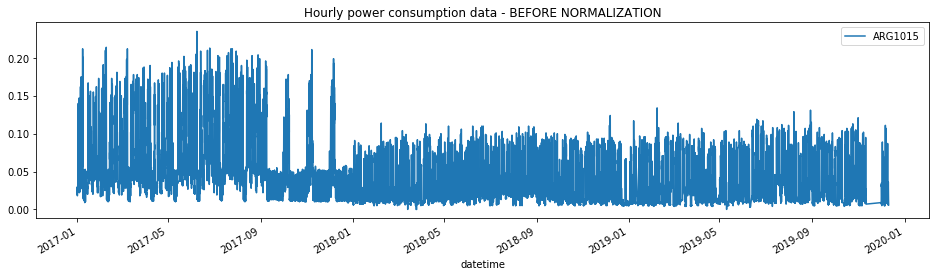

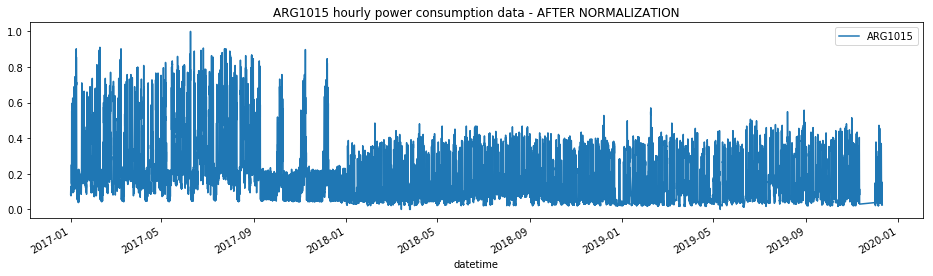

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3796, 20, 1)
y_test.shape =  (3796,)
Model: "sequential_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_91 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_181 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_92 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_182 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_93 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_183 (Dropout)        (None, 40)                0         
_______

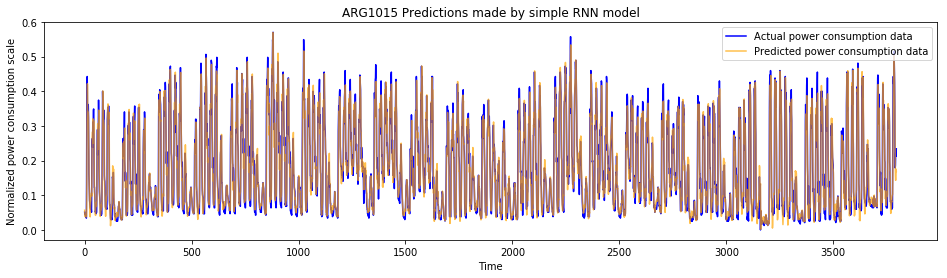

Model: "sequential_62"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_91 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_184 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_92 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_185 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_93 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_186 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_62 (Dense)             (None, 1)               

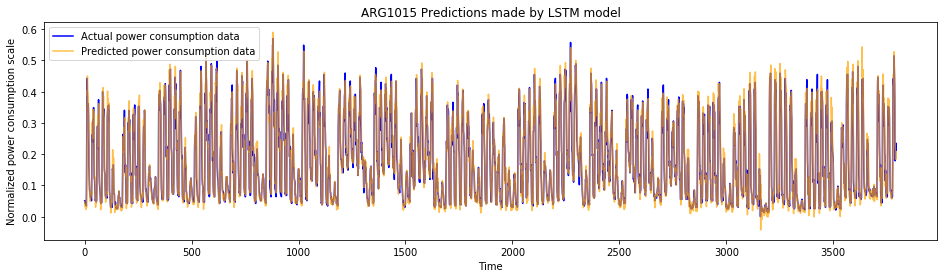

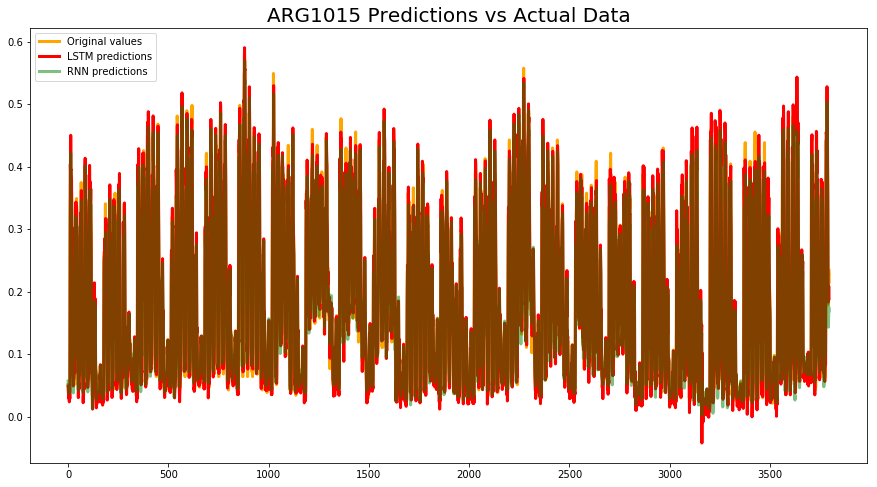

In [69]:
#dropping rows with missing data
ARG1015DF = ARG1015DF.dropna()
#checking missing data
ARG1015DF.isna().sum()

#column data type formatting
ARG1015DF.datetime = pd.to_datetime(ARG1015DF.datetime)
ARG1015DF.ARG1015 = pd.to_numeric(ARG1015DF.ARG1015)
ARG1015DF.set_index(['datetime'], inplace = True)
ARG1015DF.head()

#visualize data before normalization
ARG1015DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(ARG1015DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    ARG1015DF['ARG1015']=scaler.fit_transform(ARG1015DF['ARG1015'].values.reshape(-1,1))
    return ARG1015DF
ARG1015DF_norm = normalize_data(ARG1015DF)
ARG1015DF_norm.shape

#visualize data after normalization
ARG1015DF_norm.plot(figsize=(16,4),legend=True)
plt.title('ARG1015 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

ARG1015DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(ARG1015DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "ARG1015 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "ARG1015 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("ARG1015 Predictions vs Actual Data", fontsize=20)
plt.show()

In [70]:
# Univariate Analysis for ARG1016

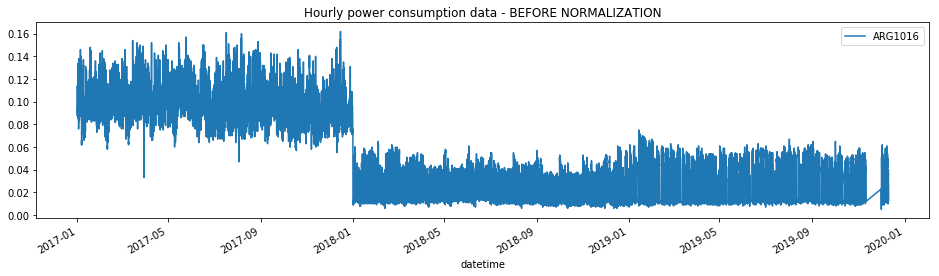

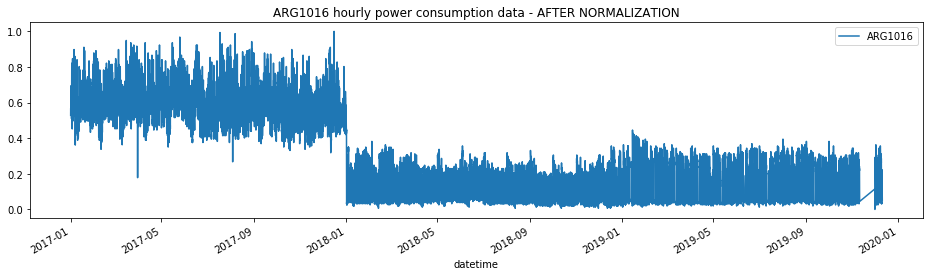

X_train.shape =  (21000, 20, 1)
y_train.shape =  (21000,)
X_test.shape =  (3796, 20, 1)
y_test.shape =  (3796,)
Model: "sequential_63"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_94 (SimpleRNN)    (None, 20, 40)            1680      
_________________________________________________________________
dropout_187 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_95 (SimpleRNN)    (None, 20, 40)            3240      
_________________________________________________________________
dropout_188 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
simple_rnn_96 (SimpleRNN)    (None, 40)                3240      
_________________________________________________________________
dropout_189 (Dropout)        (None, 40)                0         
_______

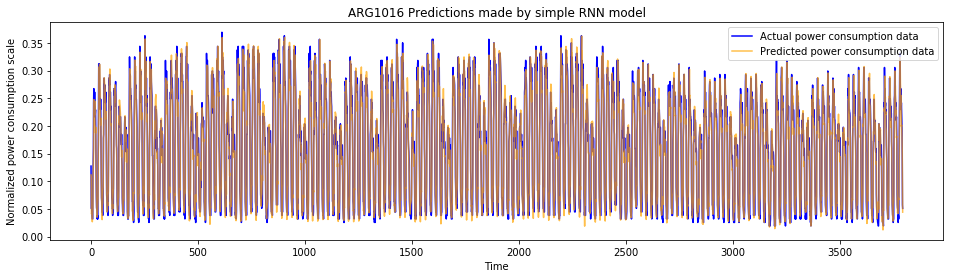

Model: "sequential_64"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_94 (LSTM)               (None, 20, 40)            6720      
_________________________________________________________________
dropout_190 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_95 (LSTM)               (None, 20, 40)            12960     
_________________________________________________________________
dropout_191 (Dropout)        (None, 20, 40)            0         
_________________________________________________________________
lstm_96 (LSTM)               (None, 40)                12960     
_________________________________________________________________
dropout_192 (Dropout)        (None, 40)                0         
_________________________________________________________________
dense_64 (Dense)             (None, 1)               

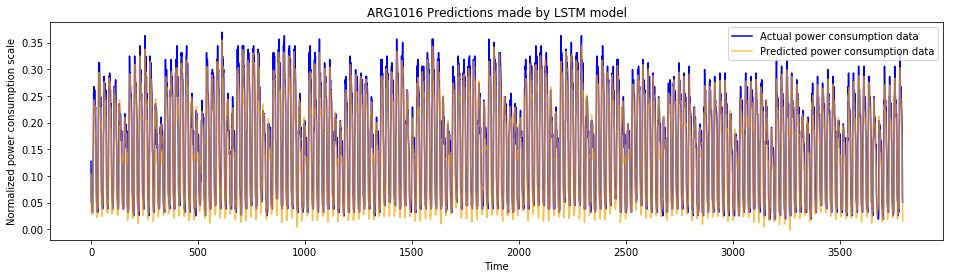

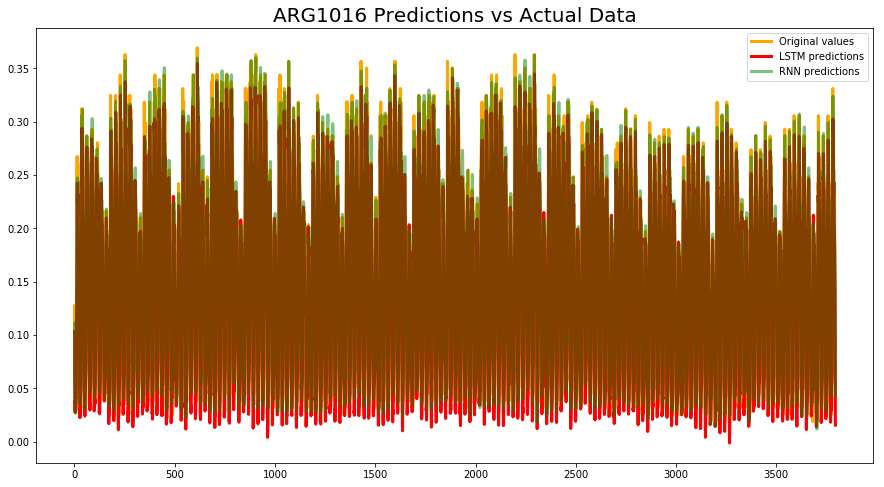

In [71]:
#dropping rows with missing data
ARG1016DF = ARG1016DF.dropna()
#checking missing data
ARG1016DF.isna().sum()

#column data type formatting
ARG1016DF.datetime = pd.to_datetime(ARG1016DF.datetime)
ARG1016DF.ARG1016 = pd.to_numeric(ARG1016DF.ARG1016)
ARG1016DF.set_index(['datetime'], inplace = True)
ARG1016DF.head()

#visualize data before normalization
ARG1016DF.plot(figsize=(16,4),legend=True)

plt.title('Hourly power consumption data - BEFORE NORMALIZATION')

plt.show()

#normalize data
def normalize_data(ARG1016DF):
    scaler = sklearn.preprocessing.MinMaxScaler()
    ARG1016DF['ARG1016']=scaler.fit_transform(ARG1016DF['ARG1016'].values.reshape(-1,1))
    return ARG1016DF
ARG1016DF_norm = normalize_data(ARG1016DF)
ARG1016DF_norm.shape

#visualize data after normalization
ARG1016DF_norm.plot(figsize=(16,4),legend=True)
plt.title('ARG1016 hourly power consumption data - AFTER NORMALIZATION')
plt.show()

ARG1016DF_norm.shape

#prepare data for training the RNN models
def load_data(stock, seq_len):
    X_train = []
    y_train = []
    for i in range(seq_len, len(stock)):
        X_train.append(stock.iloc[i-seq_len : i, 0])
        y_train.append(stock.iloc[i, 0])
    
    #1 last 3187 days are going to be used in test
    X_test = X_train[21000:]             
    y_test = y_train[21000:]
    
    #2 first 21000 days are going to be used in training
    X_train = X_train[:21000]           
    y_train = y_train[:21000]
    
    #3 convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    #4 reshape data to input into RNN models
    X_train = np.reshape(X_train, (21000, seq_len, 1))
    
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))
    
    return [X_train, y_train, X_test, y_test]

#create train, test data
seq_len = 20 #choose sequence length
X_train, y_train, X_test, y_test = load_data(ARG1016DF, seq_len)
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)


#build a simple RNN model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=True))
rnn_model.add(Dropout(0.15))
rnn_model.add(SimpleRNN(40,activation="tanh",return_sequences=False))
rnn_model.add(Dropout(0.15))
rnn_model.add(Dense(1))
rnn_model.summary()

#evaluate model performance
rnn_model.compile(optimizer="adam",loss="MSE")
rnn_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 scores
rnn_predictions = rnn_model.predict(X_test)
rnn_score = r2_score(y_test,rnn_predictions)
print("R2 Score of RNN model: ",rnn_score)

# Mean Forecast Error
forecast_errors = [y_test[i]-rnn_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, rnn_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, rnn_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
def plot_predictions(test, predicted, title):
    plt.figure(figsize=(16,4))
    plt.plot(test, color='blue',label='Actual power consumption data')
    plt.plot(predicted, alpha=0.7, color='orange',label='Predicted power consumption data')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Normalized power consumption scale')
    plt.legend()
    plt.show()
    
plot_predictions(y_test, rnn_predictions, "ARG1016 Predictions made by simple RNN model")

#build an LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True, input_shape=(X_train.shape[1],1)))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=True))
lstm_model.add(Dropout(0.15))
lstm_model.add(LSTM(40,activation="tanh",return_sequences=False))
lstm_model.add(Dropout(0.15))
lstm_model.add(Dense(1))
lstm_model.summary()

#evaluate model performance
lstm_model.compile(optimizer="adam",loss="MSE")
lstm_model.fit(X_train, y_train, epochs=50, batch_size=256)

#check r2 score
lstm_predictions = lstm_model.predict(X_test)
lstm_score = r2_score(y_test, lstm_predictions)
print("R^2 Score of LSTM model: ",lstm_score)

# Forecast Mean Error
forecast_errors = [y_test[i]-lstm_predictions[i] for i in range(len(y_test))]
bias = sum(forecast_errors) * 1.0/len(y_test)
print('Bias: %f' % bias)

# Mean Absolute Error
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, lstm_predictions)
print('MAE: %f' % mae)

# Root Mean Squared Error
from sklearn.metrics import mean_squared_error
from math import sqrt
mse = mean_squared_error(y_test, lstm_predictions)
rmse = sqrt(mse)
print('RMSE: %f' % rmse)

#compare the actual values vs predicted values by plotting a graph
plot_predictions(y_test, lstm_predictions, "ARG1016 Predictions made by LSTM model")

#compare predictions made by simple RNN and LSTM model by plotting data in a single graph
plt.figure(figsize=(15,8))
plt.plot(y_test, c="orange", linewidth=3, label="Original values")
plt.plot(lstm_predictions, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions, alpha=0.5, c="green", linewidth=3, label="RNN predictions")
plt.legend()
plt.title("ARG1016 Predictions vs Actual Data", fontsize=20)
plt.show()